## Analysis on CrimeData

### Importing modules

In [1]:
from statistics import mean
from statistics import stdev
import time
import numpy as np
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
import seaborn as sns


import shap
from sklearn import tree
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### Data preprocessing

In [2]:
df = pd.read_csv("crimedata.csv",sep='\s*,\s*',encoding='latin-1',engine='python',na_values=["?"])

In [3]:
df.shape

(2215, 147)

In [4]:
df.rename(columns = {"Êcommunityname":"CommunityName"},inplace = True)

In [5]:
df.head()

,CommunityName,state,countyCode,communityCode,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,PctEmplProfServ,PctOccupManu,PctOccupMgmtProf,MalePctDivorce,MalePctNevMarr,FemalePctDiv,TotalPctDiv,PersPerFam,PctFam2Par,PctKids2Par,PctYoungKids2Par,PctTeen2Par,PctWorkMomYoungKids,PctWorkMom,NumKidsBornNeverMar,PctKidsBornNeverMar,NumImmig,PctImmigRecent,PctImmigRec5,PctImmigRec8,PctImmigRec10,PctRecentImmig,PctRecImmig5,PctRecImmig8,PctRecImmig10,PctSpeakEnglOnly,PctNotSpeakEnglWell,PctLargHouseFam,PctLargHouseOccup,PersPerOccupHous,PersPerOwnOccHous,PersPerRentOccHous,PctPersOwnOccup,PctPersDenseHous,PctHousLess3BR,MedNumBR,HousVacant,PctHousOccup,PctHousOwnOcc,PctVacantBoarded,PctVacMore6Mos,MedYrHousBuilt,PctHousNoPhone,PctWOFullPlumb,OwnOccLowQuart,OwnOccMedVal,OwnOccHiQuart,OwnOccQrange,RentLowQ,RentMedian,RentHighQ,RentQrange,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LemasSwornFT,LemasSwFTPerPop,LemasSwFTFieldOps,LemasSwFTFieldPerPop,LemasTotalReq,LemasTotReqPerPop,PolicReqPerOffic,PolicPerPop,RacialMatchCommPol,PctPolicWhite,PctPolicBlack,PctPolicHisp,PctPolicAsian,PctPolicMinor,OfficAssgnDrugUnits,NumKindsDrugsSeiz,PolicAveOTWorked,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,murders,murdPerPop,rapes,rapesPerPop,robberies,robbbPerPop,assaults,assaultPerPop,burglaries,burglPerPop,larcenies,larcPerPop,autoTheft,autoTheftPerPop,arsons,arsonsPerPop,ViolentCrimesPerPop,nonViolPerPop
0,BerkeleyHeightstownship,NJ,39.0,5320.0,1,11980,3.10,1.37,91.78,6.50,1.88,12.47,21.44,10.93,11.33,11980,100.0,75122,89.24,1.55,70.20,23.62,1.03,18.39,79584,29711,30233,13600,5725,27101,5115.0,22838,227,1.96,5.81,9.90,48.18,2.70,64.55,14.65,28.82,5.49,50.73,3.67,26.38,5.22,4.47,3.22,91.43,90.17,95.78,95.81,44.56,58.88,31,0.36,1277,8.69,13.00,20.99,30.93,0.93,1.39,2.24,3.30,85.68,1.37,4.81,4.17,2.99,3.00,2.84,91.46,0.39,11.06,3,64,98.37,91.01,3.12,37.50,1959,0.00,0.28,215900,262600,326900,111000,685,1001,1001,316,1001,23.8,21.1,14.0,11,0,10.66,53.72,65.29,78.09,89.14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.5,1845.9,9.63,NaN,NaN,NaN,NaN,0.0,NaN,0,0.0,0.0,0.00,1.0,8.20,4.0,32.81,14.0,114.85,138.0,1132.08,16.0,131.26,2.0,16.41,41.02,1394.59
1,Marpletownship,PA,45.0,47616.0,1,23123,2.82,0.80,95.57,3.44,0.85,11.01,21.30,10.48,17.18,23123,100.0,47917,78.99,1.11,64.11,35.50,2.75,22.85,55323,20148,20191,18137,0,20074,5250.0,12222,885,3.98,5.61,13.72,29.89,2.43,61.96,12.26,29.28,6.39,37.64,4.23,27.99,6.45,5.42,3.11,86.91,85.33,96.82,86.46,51.14,62.43,43,0.24,1920,5.21,8.65,13.33,22.50,0.43,0.72,1.11,1.87,87.79,1.81,4.25,3.34,2.70,2.83,1.96,89.03,1.01,23.60,3,240,97.15,84.88,0.00,18.33,1958,0.31,0.14,136300,164200,199900,63600,467,560,672,205,627,27.6,20.7,12.5,0,0,8.30,77.17,71.27,90.22,96.12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.6,2186.7,3.84,NaN,NaN,NaN,NaN,0.0,NaN,0,0.0,1.0,4.25,5.0,21.26,24.0,102.05,57.0,242.37,376.0,1598.78,26.0,110.55,1.0,4.25,127.56,1955.95
2,Tigardcity,OR,NaN,NaN,1,29344,2.43,0.74,94.33,3.43,2.35,11.36,25.88,11.01,10.28,29344,100.0,35669,82.00,1.15,55.73,22.25,2.94,14.56,42112,16946,17103,16644,21606,15528,5954.0,8405,1389,4.75,2.80,9.09,30.13,4.01,69.80,15.95,21.52,8.79,32.48,10.10,25.78,14.76,12.55,2.95,78.54,78.85,92.37,75.72,66.08,74.19,164,0.88,1468,16.42,23.98,32.08,35.63,0.82,1.20,1.61,1.78,93.11,1.14,2.97,2.05,2.42,2.69,2.06,64.18,2.03,47.46,3,544,95.68,57.79,0.92,7.54,1976,1.55,0.12,74700,904

### Missing value analysis

In [6]:
def missing_values_table(df):
    mis_val = df.isnull().sum()
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mis_val_table_ren_columns = mis_val_table.rename(
    columns = {0 : 'Missing Values', 1 : '% of Total Values'})
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
    '% of Total Values', ascending=False).round(1)
    print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
        "There are " + str(mis_val_table_ren_columns.shape[0]) +
            " columns that have missing values.")
    #mis_val_table_ren_columns.to_csv('D:/crimedata_missingvalues.csv',index = True)
    return mis_val_table_ren_columns

missing_df = missing_values_table(df)

Your selected dataframe has 147 columns.
There are 41 columns that have missing values.


In [7]:
drop_missing = missing_df[missing_df['% of Total Values'] > 60]

In [8]:
drop_missing.index

Index(['PolicCars', 'LemasGangUnitDeploy', 'PolicOperBudg', 'PolicAveOTWorked',
       'NumKindsDrugsSeiz', 'OfficAssgnDrugUnits', 'PctPolicMinor',
       'PctPolicAsian', 'PctPolicHisp', 'PctPolicBlack', 'PctPolicWhite',
       'RacialMatchCommPol', 'PolicPerPop', 'PolicReqPerOffic',
       'LemasTotReqPerPop', 'LemasTotalReq', 'LemasSwFTFieldPerPop',
       'LemasSwFTFieldOps', 'LemasSwFTPerPop', 'LemasSwornFT',
       'PolicBudgPerPop', 'LemasPctPolicOnPatr'],
      dtype='object')

In [9]:
df.drop(columns=['PolicCars', 'LemasGangUnitDeploy', 'PolicOperBudg', 'PolicAveOTWorked',
       'NumKindsDrugsSeiz', 'OfficAssgnDrugUnits', 'PctPolicMinor',
       'PctPolicAsian', 'PctPolicHisp', 'PctPolicBlack', 'PctPolicWhite',
       'RacialMatchCommPol', 'PolicPerPop', 'PolicReqPerOffic',
       'LemasTotReqPerPop', 'LemasTotalReq', 'LemasSwFTFieldPerPop',
       'LemasSwFTFieldOps', 'LemasSwFTPerPop', 'LemasSwornFT',
       'PolicBudgPerPop', 'LemasPctPolicOnPatr','communityCode','countyCode'],inplace = True)

In [10]:
df1 = df.copy(deep = True)

In [11]:
df1_missing = df1[['ViolentCrimesPerPop', 'rapesPerPop', 'rapes', 'nonViolPerPop',
       'arsonsPerPop', 'arsons', 'assaults', 'assaultPerPop', 'autoTheft',
       'autoTheftPerPop', 'burglPerPop', 'larcPerPop', 'larcenies',
       'burglaries', 'robbbPerPop', 'robberies', 'OtherPerCap']]

In [12]:
missing_values_table(df1_missing)

Your selected dataframe has 17 columns.
There are 17 columns that have missing values.


,Missing Values,% of Total Values
ViolentCrimesPerPop,221,10.0
rapes,208,9.4
rapesPerPop,208,9.4
nonViolPerPop,97,4.4
arsonsPerPop,91,4.1
arsons,91,4.1
assaults,13,0.6
assaultPerPop,13,0.6
larcPerPop,3,0.1
burglaries,3,0.1


### Histogram of missing value data

array([[<AxesSubplot:title={'center':'ViolentCrimesPerPop'}>,
        <AxesSubplot:title={'center':'rapesPerPop'}>,
        <AxesSubplot:title={'center':'rapes'}>,
        <AxesSubplot:title={'center':'nonViolPerPop'}>],
       [<AxesSubplot:title={'center':'arsonsPerPop'}>,
        <AxesSubplot:title={'center':'arsons'}>,
        <AxesSubplot:title={'center':'assaults'}>,
        <AxesSubplot:title={'center':'assaultPerPop'}>],
       [<AxesSubplot:title={'center':'autoTheft'}>,
        <AxesSubplot:title={'center':'autoTheftPerPop'}>,
        <AxesSubplot:title={'center':'burglPerPop'}>,
        <AxesSubplot:title={'center':'larcPerPop'}>],
       [<AxesSubplot:title={'center':'larcenies'}>,
        <AxesSubplot:title={'center':'burglaries'}>,
        <AxesSubplot:title={'center':'robbbPerPop'}>,
        <AxesSubplot:title={'center':'robberies'}>],
       [<AxesSubplot:title={'center':'OtherPerCap'}>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

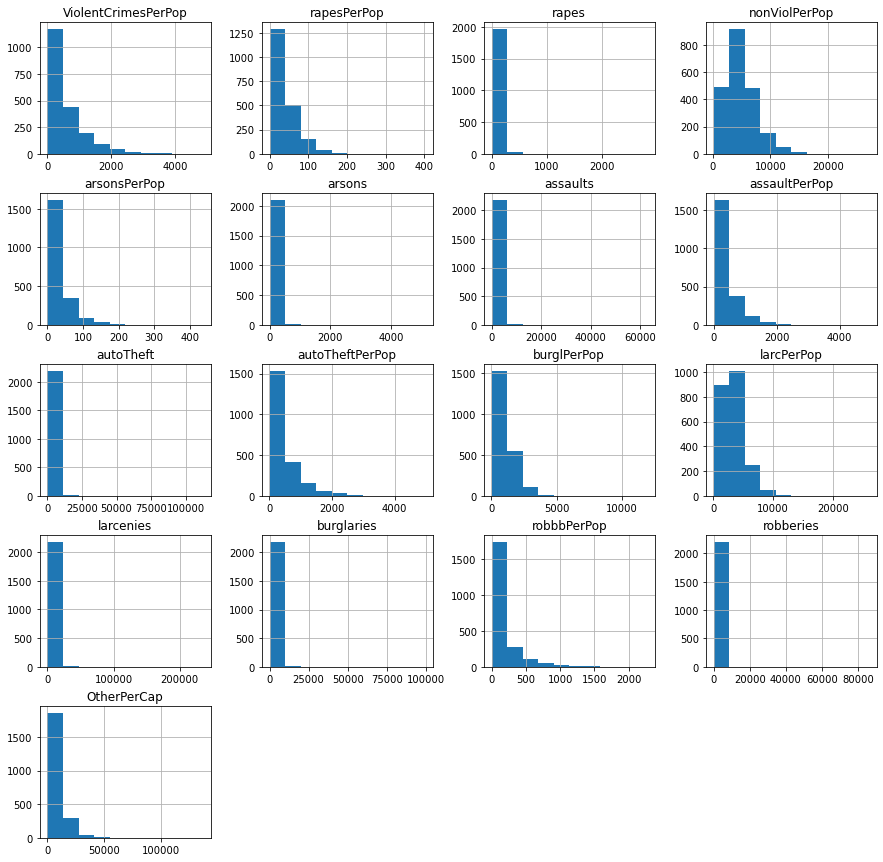

In [13]:
fig = plt.figure(figsize = (15,15))
ax = fig.gca()
df1_missing.hist(ax = ax)


In [14]:
print(df1[df1 == 0].count(axis=0)/len(df1.index)*100)

CommunityName             0.000000
state                     0.000000
fold                      0.000000
population                0.000000
householdsize             0.000000
racepctblack              0.090293
racePctWhite              0.000000
racePctAsian              0.000000
racePctHisp               0.000000
agePct12t21               0.000000
agePct12t29               0.000000
agePct16t24               0.000000
agePct65up                0.000000
numbUrban                26.997743
pctUrban                 26.997743
medIncome                 0.000000
pctWWage                  0.000000
pctWFarmSelf              1.083521
pctWInvInc                0.000000
pctWSocSec                0.000000
pctWPubAsst               0.000000
pctWRetire                0.000000
medFamInc                 0.000000
perCapInc                 0.000000
whitePerCap               0.000000
blackPerCap               2.167043
indianPerCap              7.674944
AsianPerCap               1.670429
OtherPerCap         

In [15]:
df1.head()

,CommunityName,state,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,PctEmplProfServ,PctOccupManu,PctOccupMgmtProf,MalePctDivorce,MalePctNevMarr,FemalePctDiv,TotalPctDiv,PersPerFam,PctFam2Par,PctKids2Par,PctYoungKids2Par,PctTeen2Par,PctWorkMomYoungKids,PctWorkMom,NumKidsBornNeverMar,PctKidsBornNeverMar,NumImmig,PctImmigRecent,PctImmigRec5,PctImmigRec8,PctImmigRec10,PctRecentImmig,PctRecImmig5,PctRecImmig8,PctRecImmig10,PctSpeakEnglOnly,PctNotSpeakEnglWell,PctLargHouseFam,PctLargHouseOccup,PersPerOccupHous,PersPerOwnOccHous,PersPerRentOccHous,PctPersOwnOccup,PctPersDenseHous,PctHousLess3BR,MedNumBR,HousVacant,PctHousOccup,PctHousOwnOcc,PctVacantBoarded,PctVacMore6Mos,MedYrHousBuilt,PctHousNoPhone,PctWOFullPlumb,OwnOccLowQuart,OwnOccMedVal,OwnOccHiQuart,OwnOccQrange,RentLowQ,RentMedian,RentHighQ,RentQrange,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn,murders,murdPerPop,rapes,rapesPerPop,robberies,robbbPerPop,assaults,assaultPerPop,burglaries,burglPerPop,larcenies,larcPerPop,autoTheft,autoTheftPerPop,arsons,arsonsPerPop,ViolentCrimesPerPop,nonViolPerPop
0,BerkeleyHeightstownship,NJ,1,11980,3.10,1.37,91.78,6.50,1.88,12.47,21.44,10.93,11.33,11980,100.0,75122,89.24,1.55,70.20,23.62,1.03,18.39,79584,29711,30233,13600,5725,27101,5115.0,22838,227,1.96,5.81,9.90,48.18,2.70,64.55,14.65,28.82,5.49,50.73,3.67,26.38,5.22,4.47,3.22,91.43,90.17,95.78,95.81,44.56,58.88,31,0.36,1277,8.69,13.00,20.99,30.93,0.93,1.39,2.24,3.30,85.68,1.37,4.81,4.17,2.99,3.00,2.84,91.46,0.39,11.06,3,64,98.37,91.01,3.12,37.50,1959,0.00,0.28,215900,262600,326900,111000,685,1001,1001,316,1001,23.8,21.1,14.0,11,0,10.66,53.72,65.29,78.09,89.14,6.5,1845.9,9.63,0.0,0,0.0,0.0,0.00,1.0,8.20,4.0,32.81,14.0,114.85,138.0,1132.08,16.0,131.26,2.0,16.41,41.02,1394.59
1,Marpletownship,PA,1,23123,2.82,0.80,95.57,3.44,0.85,11.01,21.30,10.48,17.18,23123,100.0,47917,78.99,1.11,64.11,35.50,2.75,22.85,55323,20148,20191,18137,0,20074,5250.0,12222,885,3.98,5.61,13.72,29.89,2.43,61.96,12.26,29.28,6.39,37.64,4.23,27.99,6.45,5.42,3.11,86.91,85.33,96.82,86.46,51.14,62.43,43,0.24,1920,5.21,8.65,13.33,22.50,0.43,0.72,1.11,1.87,87.79,1.81,4.25,3.34,2.70,2.83,1.96,89.03,1.01,23.60,3,240,97.15,84.88,0.00,18.33,1958,0.31,0.14,136300,164200,199900,63600,467,560,672,205,627,27.6,20.7,12.5,0,0,8.30,77.17,71.27,90.22,96.12,10.6,2186.7,3.84,0.0,0,0.0,1.0,4.25,5.0,21.26,24.0,102.05,57.0,242.37,376.0,1598.78,26.0,110.55,1.0,4.25,127.56,1955.95
2,Tigardcity,OR,1,29344,2.43,0.74,94.33,3.43,2.35,11.36,25.88,11.01,10.28,29344,100.0,35669,82.00,1.15,55.73,22.25,2.94,14.56,42112,16946,17103,16644,21606,15528,5954.0,8405,1389,4.75,2.80,9.09,30.13,4.01,69.80,15.95,21.52,8.79,32.48,10.10,25.78,14.76,12.55,2.95,78.54,78.85,92.37,75.72,66.08,74.19,164,0.88,1468,16.42,23.98,32.08,35.63,0.82,1.20,1.61,1.78,93.11,1.14,2.97,2.05,2.42,2.69,2.06,64.18,2.03,47.46,3,544,95.68,57.79,0.92,7.54,1976,1.55,0.12,74700,90400,112000,37300,370,428,520,150,484,24.1,21.7,11.6,16,0,5.00,44.77,36.60,61.26,82.85,10.6,2780.9,4.37,0.0,3,8.3,6.0,16.60,56.0,154.95,14.0,38.74,274.0,758.14,1797.0,4972.19,136.0,376.30,22.0,60.87,218.59,6167.51
3,Gloversvillecity,NY,1,16656,2.40,1.70,97.35,0.50,0.70,12.55,25.20,12.19,17.57,0,0.0,20580,68.15,0.24,38.95,39.48,11.71,18.33,26501,10810,10909,9984,4941,3541,2451.0,4391,2831,17.23,11.05,33.68,10.81,9.86,54.74,31.22,27.43,26.76,22.71,10.98,28.15,14.47,12.91,2.98,64.02,62.36,65.38,67.43,59.59,70.27,561,3.84,339,13.86,13.86,15.34,15.34,0.28,0.28,0.31,0.31,94.98,0.56,3.93,

### Plotting State wise violent crimes

In [16]:
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode,iplot
init_notebook_mode(connected=True)

In [17]:
#group Violent crime and nonViolent crime by state
crimedata_state = df1.groupby('state').agg({'ViolentCrimesPerPop':'mean','nonViolPerPop':'mean'})[['ViolentCrimesPerPop','nonViolPerPop']].reset_index()

##Aggregate view of Non-Violent Crimes by State
data1 = dict(type='choropleth',
        colorscale = 'Viridis',
        autocolorscale = False,
        locations = crimedata_state['state'],
        locationmode = 'USA-states',
        z = crimedata_state['nonViolPerPop'].astype(float),
        colorbar = {'title':'non-Violent Crimes(Per-100K-Pop)'}
        )
layout1 = dict(
        title = 'Aggregate view of non-Violent Crimes Per 100K Population',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor='rgb(85,173,240)'),
             )
    
fig1 = go.Figure(data = [data1],layout = layout1)
iplot(fig1,validate=False)

##Aggregate view of Violent Crimes by State
data2 = dict(type='choropleth',
        autocolorscale = False,
        colorscale = "Earth",
        locations = crimedata_state['state'],
        locationmode = 'USA-states',
        z = crimedata_state['ViolentCrimesPerPop'].astype('float'),
        colorbar = {'title':'Violent Crimes(Per-100K-Pop)'}
        )
layout2 = dict(
        title = 'Aggregate view of Violent Crimes Per 100K Population across US',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(85,173,240)'),
             )
    
fig2 = go.Figure(data = [data2],layout = layout2)
iplot(fig2,validate=False)

### Exploratory Data Analysis of Response Variables

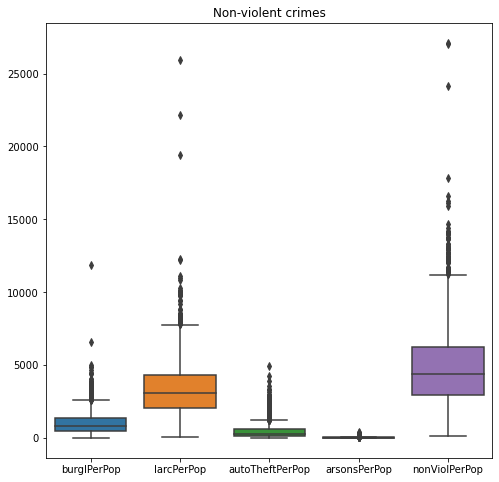

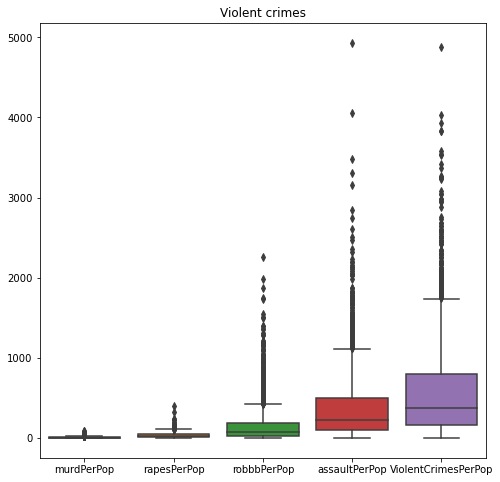

In [18]:
#Boxplot of non violent crime variables
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
nonViolent = df1[['burglPerPop','larcPerPop','autoTheftPerPop','arsonsPerPop','nonViolPerPop']]
xticklablesNV = ['burglPerPop','larcPerPop','autoTheftPerPop','arsonsPerPop','nonViolPerPop']
sns.boxplot(data=nonViolent)
ax.set(title="Non-violent crimes")
ax.set_xticklabels(xticklablesNV)
plt.show()


#Boxplot of Violent crime variables
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111)
Violent = df1[['murdPerPop','rapesPerPop','robbbPerPop','assaultPerPop','ViolentCrimesPerPop']]
xticklablesV = ['murdPerPop','rapesPerPop','robbbPerPop','assaultPerPop','ViolentCrimesPerPop']
sns.boxplot(data=Violent)
ax.set(title="Violent crimes")
ax.set_xticklabels(xticklablesV)
plt.show()

### Observing unique values

In [19]:
def extract_info(df1):
    datatypes = df1.dtypes
    count_unique = df1.apply(lambda col: col.nunique())
    unique_values = df1.apply(lambda col: col.unique())
    info_table = pd.concat([datatypes, count_unique, unique_values], axis=1)
    info_table_columns = info_table.rename(
    columns = {0 : 'DataTypes', 1 : 'Count of Unique Values', 2 : 'Unique Values'})
    #info_table_columns.to_csv('D:/crimedata_info.csv',index = True)
    return info_table_columns

extract_info(df1)


,DataTypes,Count of Unique Values,Unique Values
CommunityName,object,2018,"[BerkeleyHeightstownship, Marpletownship, Tiga..."
state,object,48,"[NJ, PA, OR, NY, MN, MO, MA, IN, ND, TX, CA, K..."
fold,int64,10,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]"
population,int64,2154,"[11980, 23123, 29344, 16656, 11245, 140494, 28..."
householdsize,float64,198,"[3.1, 2.82, 2.43, 2.4, 2.76, 2.45, 2.6, 2.46, ..."
racepctblack,float64,1172,"[1.37, 0.8, 0.74, 1.7, 0.53, 2.51, 1.6, 14.2, ..."
racePctWhite,float64,1609,"[91.78, 95.57, 94.33, 97.35, 89.16, 95.65, 96...."
racePctAsian,float64,667,"[6.5, 3.44, 3.43, 0.5, 1.17, 0.9, 1.47, 0.4, 1..."
racePctHisp,float64,1026,"[1.88, 0.85, 2.35, 0.7, 0.52, 0.95, 1.1, 0.63,..."
agePct12t21,float64,950,"[12.47, 11.01, 11.36, 12.55, 24.46, 18.09, 11...."


In [20]:
df1.drop('CommunityName',axis = 1,inplace = True)

In [21]:
df1.columns

Index(['state', 'fold', 'population', 'householdsize', 'racepctblack',
       'racePctWhite', 'racePctAsian', 'racePctHisp', 'agePct12t21',
       'agePct12t29',
       ...
       'burglaries', 'burglPerPop', 'larcenies', 'larcPerPop', 'autoTheft',
       'autoTheftPerPop', 'arsons', 'arsonsPerPop', 'ViolentCrimesPerPop',
       'nonViolPerPop'],
      dtype='object', length=122)

### Imputing using KNN Imputer and scaling data for fitting

#### We are scaling categorical columns with Binary Encoding

In [22]:
import category_encoders as ce
encoder= ce.BinaryEncoder(cols=['state'],return_df=True)
#Fit and Transform Data 
data_encoded=encoder.fit_transform(df1) 
data_encoded

,state_0,state_1,state_2,state_3,state_4,state_5,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,PctEmplProfServ,PctOccupManu,PctOccupMgmtProf,MalePctDivorce,MalePctNevMarr,FemalePctDiv,TotalPctDiv,PersPerFam,PctFam2Par,PctKids2Par,PctYoungKids2Par,PctTeen2Par,PctWorkMomYoungKids,PctWorkMom,NumKidsBornNeverMar,PctKidsBornNeverMar,NumImmig,PctImmigRecent,PctImmigRec5,PctImmigRec8,PctImmigRec10,PctRecentImmig,PctRecImmig5,PctRecImmig8,PctRecImmig10,PctSpeakEnglOnly,PctNotSpeakEnglWell,PctLargHouseFam,PctLargHouseOccup,PersPerOccupHous,PersPerOwnOccHous,PersPerRentOccHous,PctPersOwnOccup,PctPersDenseHous,PctHousLess3BR,MedNumBR,HousVacant,PctHousOccup,PctHousOwnOcc,PctVacantBoarded,PctVacMore6Mos,MedYrHousBuilt,PctHousNoPhone,PctWOFullPlumb,OwnOccLowQuart,OwnOccMedVal,OwnOccHiQuart,OwnOccQrange,RentLowQ,RentMedian,RentHighQ,RentQrange,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn,murders,murdPerPop,rapes,rapesPerPop,robberies,robbbPerPop,assaults,assaultPerPop,burglaries,burglPerPop,larcenies,larcPerPop,autoTheft,autoTheftPerPop,arsons,arsonsPerPop,ViolentCrimesPerPop,nonViolPerPop
0,0,0,0,0,0,1,1,11980,3.10,1.37,91.78,6.50,1.88,12.47,21.44,10.93,11.33,11980,100.00,75122,89.24,1.55,70.20,23.62,1.03,18.39,79584,29711,30233,13600,5725,27101,5115.0,22838,227,1.96,5.81,9.90,48.18,2.70,64.55,14.65,28.82,5.49,50.73,3.67,26.38,5.22,4.47,3.22,91.43,90.17,95.78,95.81,44.56,58.88,31,0.36,1277,8.69,13.00,20.99,30.93,0.93,1.39,2.24,3.30,85.68,1.37,4.81,4.17,2.99,3.00,2.84,91.46,0.39,11.06,3,64,98.37,91.01,3.12,37.50,1959,0.00,0.28,215900,262600,326900,111000,685,1001,1001,316,1001,23.8,21.1,14.0,11,0,10.66,53.72,65.29,78.09,89.14,6.5,1845.9,9.63,0.00,0,0.00,0.0,0.00,1.0,8.20,4.0,32.81,14.0,114.85,138.0,1132.08,16.0,131.26,2.0,16.41,41.02,1394.59
1,0,0,0,0,1,0,1,23123,2.82,0.80,95.57,3.44,0.85,11.01,21.30,10.48,17.18,23123,100.00,47917,78.99,1.11,64.11,35.50,2.75,22.85,55323,20148,20191,18137,0,20074,5250.0,12222,885,3.98,5.61,13.72,29.89,2.43,61.96,12.26,29.28,6.39,37.64,4.23,27.99,6.45,5.42,3.11,86.91,85.33,96.82,86.46,51.14,62.43,43,0.24,1920,5.21,8.65,13.33,22.50,0.43,0.72,1.11,1.87,87.79,1.81,4.25,3.34,2.70,2.83,1.96,89.03,1.01,23.60,3,240,97.15,84.88,0.00,18.33,1958,0.31,0.14,136300,164200,199900,63600,467,560,672,205,627,27.6,20.7,12.5,0,0,8.30,77.17,71.27,90.22,96.12,10.6,2186.7,3.84,0.00,0,0.00,1.0,4.25,5.0,21.26,24.0,102.05,57.0,242.37,376.0,1598.78,26.0,110.55,1.0,4.25,127.56,1955.95
2,0,0,0,0,1,1,1,29344,2.43,0.74,94.33,3.43,2.35,11.36,25.88,11.01,10.28,29344,100.00,35669,82.00,1.15,55.73,22.25,2.94,14.56,42112,16946,17103,16644,21606,15528,5954.0,8405,1389,4.75,2.80,9.09,30.13,4.01,69.80,15.95,21.52,8.79,32.48,10.10,25.78,14.76,12.55,2.95,78.54,78.85,92.37,75.72,66.08,74.19,164,0.88,1468,16.42,23.98,32.08,35.63,0.82,1.20,1.61,1.78,93.11,1.14,2.97,2.05,2.42,2.69,2.06,64.18,2.03,47.46,3,544,95.68,57.79,0.92,7.54,1976,1.55,0.12,74700,90400,112000,37300,370,428,520,150,484,24.1,21.7,11.6,16,0,5.00,44.77,36.60,61.26,82.85,10.6,2780.9,4.37,0.00,3,8.30,6.0,16.60,56.0,154.95,14.0,38.74,274.0,758.14,1797.0,4972.19,136.0,376.30,22.0,60.87,218.59,6167.51
3,0,0,0,1,0,0,1,16656,2.40,1.70,97.35,0.50,0.70,12.55,25.20,12.19,17.57,0,0.00,20580,68.15,0.24,38.95,39.48,11.71,18.33,26501,10810,10909,9984,4941,3541,2451.0,4391,2831,17.23,11.05,33.68,10.81,9.86,54.74,31.22,27.43,26.76,22.71,10.98,28.15,14.47,12.91,2.98,64.02,62.36,65.38,67.43,59.59,70.27,561,3.84,339,13.86,13.86,15.34,15.34,0.28,0.28,0.31,0.31,94.98,0.5

In [23]:
data_encoded.drop('fold',axis = 1,inplace = True)

In [24]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
data_encoded = pd.DataFrame(scaler.fit_transform(data_encoded), columns = data_encoded.columns)
data_encoded.head()


,state_0,state_1,state_2,state_3,state_4,state_5,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,PctEmplProfServ,PctOccupManu,PctOccupMgmtProf,MalePctDivorce,MalePctNevMarr,FemalePctDiv,TotalPctDiv,PersPerFam,PctFam2Par,PctKids2Par,PctYoungKids2Par,PctTeen2Par,PctWorkMomYoungKids,PctWorkMom,NumKidsBornNeverMar,PctKidsBornNeverMar,NumImmig,PctImmigRecent,PctImmigRec5,PctImmigRec8,PctImmigRec10,PctRecentImmig,PctRecImmig5,PctRecImmig8,PctRecImmig10,PctSpeakEnglOnly,PctNotSpeakEnglWell,PctLargHouseFam,PctLargHouseOccup,PersPerOccupHous,PersPerOwnOccHous,PersPerRentOccHous,PctPersOwnOccup,PctPersDenseHous,PctHousLess3BR,MedNumBR,HousVacant,PctHousOccup,PctHousOwnOcc,PctVacantBoarded,PctVacMore6Mos,MedYrHousBuilt,PctHousNoPhone,PctWOFullPlumb,OwnOccLowQuart,OwnOccMedVal,OwnOccHiQuart,OwnOccQrange,RentLowQ,RentMedian,RentHighQ,RentQrange,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn,murders,murdPerPop,rapes,rapesPerPop,robberies,robbbPerPop,assaults,assaultPerPop,burglaries,burglPerPop,larcenies,larcPerPop,autoTheft,autoTheftPerPop,arsons,arsonsPerPop,ViolentCrimesPerPop,nonViolPerPop
0,-0.346965,-0.629059,-1.03914,-0.795159,-1.172204,0.884296,-0.201091,1.175511,-0.559192,0.475175,0.856235,-0.416149,-0.437364,-1.004000,-0.510125,-0.106018,-0.173938,0.670172,3.064996,1.374690,0.969961,2.068751,-0.336328,-1.228157,0.523854,2.788249,2.246363,2.153574,0.222995,-0.437978,1.303063,-0.546113,2.009100,-0.187125,-1.123526,-0.506608,-1.129069,1.980640,-1.155538,0.304252,-0.441979,0.643996,-1.295599,2.415353,-1.947666,-0.529588,-2.178286,-2.114026,0.375185,1.650662,1.573013,1.134868,1.957769,-1.996051,-1.493579,-0.143671,-0.881203,-0.090246,-0.494554,-0.598127,-0.456242,-0.233032,-0.106007,-0.124959,-0.020543,0.083910,-0.099126,-0.246065,-0.152004,0.080065,1.185639,0.872755,1.207152,1.769509,-0.668547,-2.493267,0.701110,-0.259038,1.078663,1.979086,0.095077,0.196006,-0.324567,-1.049562,-0.340943,1.908376,1.825697,1.834000,1.390813,2.463698,3.354246,2.377702,1.393576,2.951742,-0.838677,0.036774,0.697355,-0.099186,-0.072631,0.394424,-0.466947,1.307721,0.062425,0.141107,-0.190532,-0.331619,1.341436,-0.340751,-0.133523,-0.640027,-0.265616,-1.059223,-0.105302,-0.658662,-0.162279,-0.787865,-0.240192,-1.203619,-0.263149,-1.178871,-0.153708,-0.679228,-0.160525,-0.401300,-0.891689,-1.282794
1,-0.346965,-0.629059,-1.03914,-0.795159,0.853094,-1.130843,-0.146622,0.337299,-0.599209,0.706056,0.172105,-0.486762,-0.760544,-1.026653,-0.585510,1.118732,-0.119730,0.670172,1.038047,0.085200,0.331216,1.592413,1.096079,-0.862143,1.488907,1.085483,0.723626,0.571012,0.714544,-0.823488,0.591759,-0.529077,0.204497,-0.170404,-0.888599,-0.536615,-0.781386,0.538705,-1.248803,-0.007414,-0.737134,0.713086,-1.155605,1.011452,-1.747817,-0.331463,-1.801203,-1.797381,-0.081838,1.221151,1.171098,1.219690,1.055514,-1.174284,-0.962019,-0.142854,-0.919578,-0.078641,-0.850459,-0.948719,-0.989462,-0.749461,-0.419407,-0.397261,-0.364436,-0.252917,0.050807,-0.141538,-0.299626,-0.181347,0.266681,0.301045,-1.039366,1.598133,-0.557791,-1.582938,0.701110,-0.231971,0.836580,1.540191,-0.773620,-1.182305,-0.414140,-0.973716,-0.669511,0.714180,0.624054,0.551283,0.178464,0.950921,0.770283,0.726475,0.090552,0.741778,0.437080,-0.097142,-0.359460,-0.118685,-0.072631,0.114025,0.933364,1.876402,1.177753,1.099084,-0.153190,-0.211125,0.162644,-0.340751,-0.133523,-0.640027,-0.256145,-0.935067,-0.103525,-0.602953,-0.152216,-0.629833,-0.226370,-1.036529,-0.231828,-0.933354,-0.1

In [25]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
df_cleaned = pd.DataFrame(imputer.fit_transform(data_encoded),columns = data_encoded.columns)

In [26]:
df_cleaned.isnull().sum().sum()

0

### Observing Skewness

In [27]:
def observe_skewness(df):
    counter = 1
    for col in df.columns:
        if df[col].dtypes != 'object' and df[col].skew() > 10:
            print(f"{counter}--{col} --> {df[col].skew()}")
            df[col] = np.log10(df[col]+1)
            print(f"{counter}--{col} --> {df[col].skew()}")
            counter += 1
observe_skewness(df_cleaned)

1--population --> 24.320613366005784
1--population --> 4.8925006125227375
2--numbUrban --> 24.04630102925206
2--numbUrban --> 4.422731951604417
3--indianPerCap --> 15.822751795082505
3--indianPerCap --> -0.3357441224130934
4--NumUnderPov --> 23.81123970524638
4--NumUnderPov --> 5.544835738624523
5--NumKidsBornNeverMar --> 25.209632522300332
5--NumKidsBornNeverMar --> 6.826251583905246
6--NumImmig --> 30.513238374922736
6--NumImmig --> 9.097363201871204
7--HousVacant --> 15.032465434484834
7--HousVacant --> 4.32556747627399
8--NumInShelters --> 33.196624898749164
8--NumInShelters --> 6.964213900991993
9--NumStreet --> 36.194676946455026
9--NumStreet --> 11.086557984525292
10--LandArea --> 23.84973298935828
10--LandArea --> 5.253174598627048
11--murders --> 22.333077417858267
11--murders --> 7.0662638857357605
12--rapes --> 13.896642333704762
12--rapes --> 4.062660329474211
13--robberies --> 29.065621372140225
13--robberies --> 8.363577855504916
14--assaults --> 22.3382322155186
14--assa

### Pearsons Correlation Analysis

In [28]:
cor = df_cleaned.corr()

In [29]:
threshold = 0.5
corr_matrix = abs(cor['ViolentCrimesPerPop'])
corr_result = corr_matrix[corr_matrix>0.5]
corr_result = pd.DataFrame(corr_result)

In [30]:
corr_result.reset_index(inplace = True)

In [31]:
corr_result['index'].unique()

array(['racepctblack', 'racePctWhite', 'pctWInvInc', 'pctWPubAsst',
       'PctPopUnderPov', 'PctUnemployed', 'MalePctDivorce',
       'FemalePctDiv', 'TotalPctDiv', 'PctFam2Par', 'PctKids2Par',
       'PctYoungKids2Par', 'PctTeen2Par', 'NumKidsBornNeverMar',
       'PctKidsBornNeverMar', 'PctPersOwnOccup', 'PctVacantBoarded',
       'PctHousNoPhone', 'murdPerPop', 'rapes', 'rapesPerPop',
       'robbbPerPop', 'assaults', 'assaultPerPop', 'burglaries',
       'burglPerPop', 'larcPerPop', 'autoTheftPerPop',
       'ViolentCrimesPerPop', 'nonViolPerPop'], dtype=object)

In [32]:
corr_graph = df_cleaned[['ViolentCrimesPerPop','racepctblack', 'racePctWhite', 'pctWInvInc', 'pctWPubAsst',
       'PctPopUnderPov', 'MalePctDivorce', 'FemalePctDiv', 'TotalPctDiv',
       'PctFam2Par', 'PctKids2Par', 'PctYoungKids2Par', 'PctTeen2Par',
       'PctKidsBornNeverMar', 'PctPersOwnOccup', 'murdPerPop',
       'rapesPerPop', 'robbbPerPop', 'assaultPerPop', 'burglPerPop',
       'larcPerPop', 'autoTheftPerPop',
       'nonViolPerPop']]

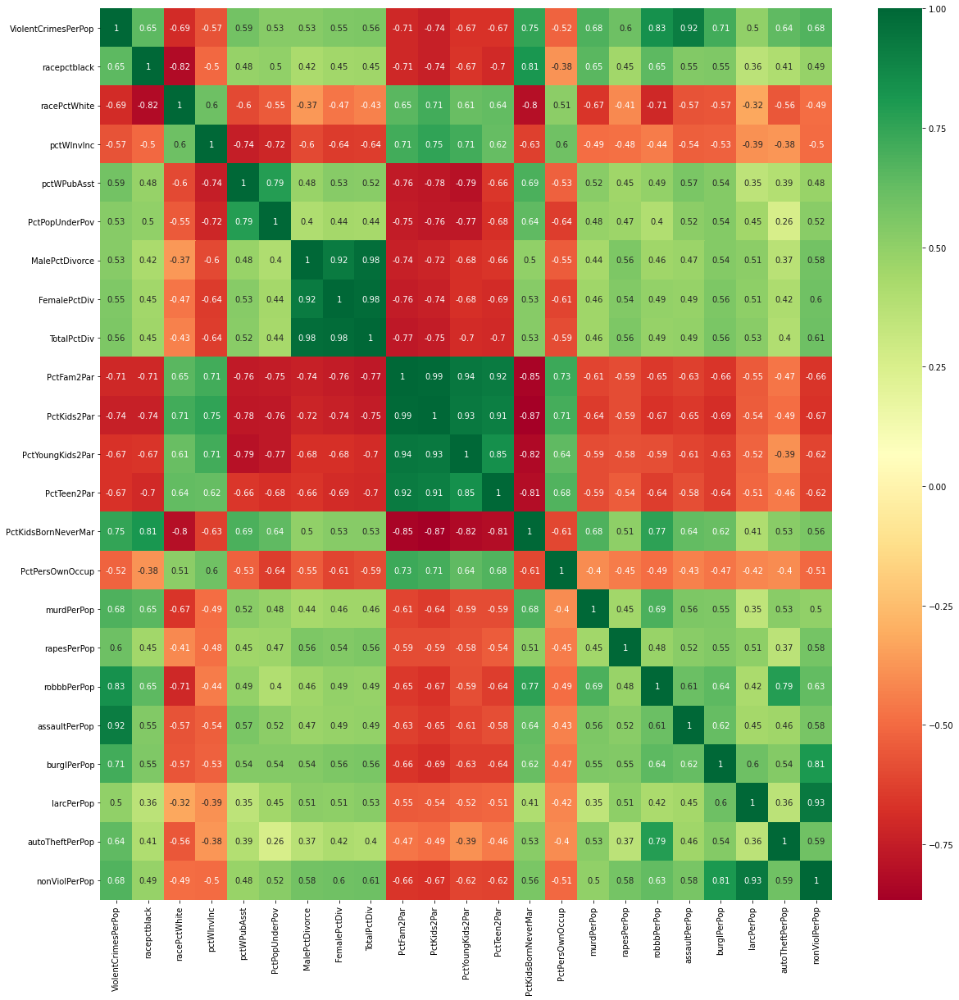

In [33]:
corrmat = corr_graph.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
corr =sns.heatmap(corr_graph[top_corr_features].corr(),annot=True,cmap="RdYlGn")
#plt.savefig('Corr_main_covid_final1.png')

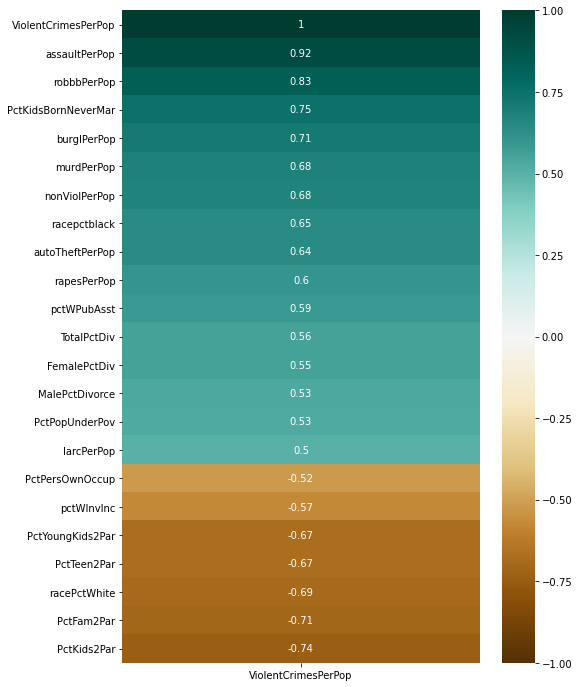

In [34]:
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(corr_graph.corr()[['ViolentCrimesPerPop']].sort_values(by='ViolentCrimesPerPop', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
#heatmap.set_title('Features Correlating with Sales Price', fontdict={'fontsize':18}, pad=16);

### Variance Inflation Factor

In [35]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [36]:
vif_data = pd.DataFrame()
vif_data["feature"] = df_cleaned.columns
vif_data["VIF"] = [variance_inflation_factor(df_cleaned.values, i) for i in range(len(df_cleaned.columns))]

In [37]:
vif_data[vif_data['VIF'] >= 5].sort_values(by= ['VIF'],ascending=False)

,feature,VIF
85,OwnOccLowQuart,inf
92,RentQrange,inf
91,RentHighQ,inf
89,RentLowQ,inf
88,OwnOccQrange,inf
87,OwnOccHiQuart,inf
47,TotalPctDiv,2901.521428
73,PctPersOwnOccup,933.029553
46,FemalePctDiv,918.294854
79,PctHousOwnOcc,899.235511


In [38]:
vif_data_corr = pd.DataFrame()
vif_data_corr["feature"] = corr_graph.columns
vif_data_corr["VIF"] = [variance_inflation_factor(corr_graph.values, i) for i in range(len(corr_graph.columns))]

In [39]:
vif_data_corr[vif_data_corr['VIF'] >= 5].sort_values(by= ['VIF'],ascending=False)

,feature,VIF
8,TotalPctDiv,1486.699066
7,FemalePctDiv,480.723724
6,MalePctDivorce,306.050204
22,nonViolPerPop,103.417054
9,PctFam2Par,76.201637
10,PctKids2Par,65.925061
20,larcPerPop,51.394892
0,ViolentCrimesPerPop,32.303708
18,assaultPerPop,14.458725
11,PctYoungKids2Par,11.752130


### Feature Selection 

In [40]:
corr_temp = df_cleaned.copy(deep = True)

In [41]:
cor = df_cleaned.corr()

,state_0,state_1,state_2,state_3,state_4,state_5,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,PctEmplProfServ,PctOccupManu,PctOccupMgmtProf,MalePctDivorce,MalePctNevMarr,FemalePctDiv,TotalPctDiv,PersPerFam,PctFam2Par,PctKids2Par,PctYoungKids2Par,PctTeen2Par,PctWorkMomYoungKids,PctWorkMom,NumKidsBornNeverMar,PctKidsBornNeverMar,NumImmig,PctImmigRecent,PctImmigRec5,PctImmigRec8,PctImmigRec10,PctRecentImmig,PctRecImmig5,PctRecImmig8,PctRecImmig10,PctSpeakEnglOnly,PctNotSpeakEnglWell,PctLargHouseFam,PctLargHouseOccup,PersPerOccupHous,PersPerOwnOccHous,PersPerRentOccHous,PctPersOwnOccup,PctPersDenseHous,PctHousLess3BR,MedNumBR,HousVacant,PctHousOccup,PctHousOwnOcc,PctVacantBoarded,PctVacMore6Mos,MedYrHousBuilt,PctHousNoPhone,PctWOFullPlumb,OwnOccLowQuart,OwnOccMedVal,OwnOccHiQuart,OwnOccQrange,RentLowQ,RentMedian,RentHighQ,RentQrange,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn,murders,murdPerPop,rapes,rapesPerPop,robberies,robbbPerPop,assaults,assaultPerPop,burglaries,burglPerPop,larcenies,larcPerPop,autoTheft,autoTheftPerPop,arsons,arsonsPerPop,ViolentCrimesPerPop,nonViolPerPop
0,-0.346965,-0.629059,-1.03914,-0.795159,-1.172204,0.884296,-0.097503,1.175511,-0.559192,0.475175,0.856235,-0.416149,-0.437364,-1.004000,-0.510125,-0.106018,-0.082987,0.670172,3.064996,1.374690,0.969961,2.068751,-0.336328,-1.228157,0.523854,2.788249,2.246363,2.153574,0.222995,-0.250247,1.303063,-0.546113,2.009100,-0.089976,-1.123526,-0.506608,-1.129069,1.980640,-1.155538,0.304252,-0.441979,0.643996,-1.295599,2.415353,-1.947666,-0.529588,-2.178286,-2.114026,0.375185,1.650662,1.573013,1.134868,1.957769,-1.996051,-1.493579,-0.067359,-0.881203,-0.041076,-0.494554,-0.598127,-0.456242,-0.233032,-0.106007,-0.124959,-0.020543,0.083910,-0.099126,-0.246065,-0.152004,0.080065,1.185639,0.872755,1.207152,1.769509,-0.668547,-2.493267,0.701110,-0.130204,1.078663,1.979086,0.095077,0.196006,-0.324567,-1.049562,-0.340943,1.908376,1.825697,1.834000,1.390813,2.463698,3.354246,2.377702,1.393576,2.951742,-0.838677,0.036774,0.697355,-0.045365,-0.032747,0.394424,-0.466947,1.307721,0.062425,0.141107,-0.091800,-0.331619,1.341436,-0.340751,-0.062243,-0.640027,-0.134077,-1.059223,-0.048324,-0.658662,-0.076900,-0.787865,-0.119296,-1.203619,-0.132620,-1.178871,-0.072480,-0.679228,-0.075992,-0.401300,-0.891689,-1.282794
1,-0.346965,-0.629059,-1.03914,-0.795159,0.853094,-1.130843,-0.068858,0.337299,-0.599209,0.706056,0.172105,-0.486762,-0.760544,-1.026653,-0.585510,1.118732,-0.055384,0.670172,1.038047,0.085200,0.331216,1.592413,1.096079,-0.862143,1.488907,1.085483,0.723626,0.571012,0.714544,-0.753225,0.591759,-0.529077,0.204497,-0.081134,-0.888599,-0.536615,-0.781386,0.538705,-1.248803,-0.007414,-0.737134,0.713086,-1.155605,1.011452,-1.747817,-0.331463,-1.801203,-1.797381,-0.081838,1.221151,1.171098,1.219690,1.055514,-1.174284,-0.962019,-0.066945,-0.919578,-0.035571,-0.850459,-0.948719,-0.989462,-0.749461,-0.419407,-0.397261,-0.364436,-0.252917,0.050807,-0.141538,-0.299626,-0.181347,0.266681,0.301045,-1.039366,1.598133,-0.557791,-1.582938,0.701110,-0.114622,0.836580,1.540191,-0.773620,-1.182305,-0.414140,-0.973716,-0.669511,0.714180,0.624054,0.551283,0.178464,0.950921,0.770283,0.726475,0.090552,0.741778,0.437080,-0.097142,-0.359460,-0.054869,-0.032747,0.114025,0.933364,1.876402,1.177753,1.099084,-0.072214,-0.211125,0.162644,-0.340751,-0.062243,-0.640027,-0.128512,-0.935067,-0.047462,-0.602953,-0.071715,-0.629833,-0.111467,-1.036529,-0.114542,-0.933354,-0.0

### Selected Variables

In [42]:
#Correlation with output variable
cor_target = abs(cor["ViolentCrimesPerPop"])
#Selecting highly correlated features
relevant_features = cor_target[cor_target>0.5]
relevant_features

racepctblack           0.646971
racePctWhite           0.692635
pctWInvInc             0.573221
pctWPubAsst            0.586478
PctPopUnderPov         0.528441
PctUnemployed          0.512597
MalePctDivorce         0.531390
FemalePctDiv           0.554955
TotalPctDiv            0.555838
PctFam2Par             0.710747
PctKids2Par            0.740205
PctYoungKids2Par       0.673100
PctTeen2Par            0.673574
NumKidsBornNeverMar    0.513258
PctKidsBornNeverMar    0.751193
PctPersOwnOccup        0.520281
PctVacantBoarded       0.511126
PctHousNoPhone         0.502196
murdPerPop             0.682796
rapes                  0.536051
rapesPerPop            0.601919
robbbPerPop            0.833103
assaults               0.609242
assaultPerPop          0.919158
burglaries             0.537756
burglPerPop            0.711586
larcPerPop             0.502070
autoTheftPerPop        0.641867
ViolentCrimesPerPop    1.000000
nonViolPerPop          0.675966
Name: ViolentCrimesPerPop, dtype: float6

In [54]:
relevant_features.index

Index(['racepctblack', 'racePctWhite', 'pctWInvInc', 'pctWPubAsst',
       'PctPopUnderPov', 'PctUnemployed', 'MalePctDivorce', 'FemalePctDiv',
       'TotalPctDiv', 'PctFam2Par', 'PctKids2Par', 'PctYoungKids2Par',
       'PctTeen2Par', 'NumKidsBornNeverMar', 'PctKidsBornNeverMar',
       'PctPersOwnOccup', 'PctVacantBoarded', 'PctHousNoPhone', 'murdPerPop',
       'rapes', 'rapesPerPop', 'robbbPerPop', 'assaults', 'assaultPerPop',
       'burglaries', 'burglPerPop', 'larcPerPop', 'autoTheftPerPop',
       'ViolentCrimesPerPop', 'nonViolPerPop'],
      dtype='object')

In [55]:
df_cleaned.shape

(2215, 126)

### Splitting the Model

In [56]:
df_cleaned_train = df_cleaned.copy(deep = True)

In [57]:
y = df_cleaned_train['ViolentCrimesPerPop']
X = df_cleaned_train.drop(columns = 'ViolentCrimesPerPop')

In [58]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [59]:
print('Training Features Shape:', X_train.shape)
print('Training Labels Shape:', y_train.shape)
print('Testing Features Shape:', X_test.shape)
print('Testing Labels Shape:', y_test.shape)

Training Features Shape: (1484, 125)
Training Labels Shape: (1484,)
Testing Features Shape: (731, 125)
Testing Labels Shape: (731,)


In [60]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state = 42)
# Train the model on training data
rf.fit(X_train,y_train)

RandomForestRegressor(random_state=42)

In [61]:
from sklearn.metrics import mean_squared_error

In [62]:
prediction = rf.predict(X_test)
mse = mean_squared_error(y_test, prediction)
rmse = mse**.5
print(f"The mse for RandomForestregressor is { mse}")
print(f"The rmse for RandomForestregressor is { rmse}")

The mse for RandomForestregressor is 0.021015169567695027
The rmse for RandomForestregressor is 0.144966097994307


In [63]:
predictions = rf.predict(X_test)
# Calculate the absolute errors
errors = abs(predictions - y_test)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

Mean Absolute Error: 0.07 degrees.


In [64]:
#Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test)
# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Accuracy: 93.96 %.


In [65]:
import shap
import xgboost as xgb
from catboost import Pool
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor
from mlxtend.regressor import StackingRegressor
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error
from xgboost import XGBRegressor

In [66]:
def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model):
    rmse = np.sqrt(-cross_val_score(model, X_train,y_train, scoring="neg_mean_squared_error", cv=kf))
    return (rmse)

In [67]:
# 10 Fold Cross validation

kf = KFold(n_splits=2, random_state=42,shuffle = True)

cv_scores = []
cv_std = []

baseline_models = ['Linear_Reg.','Bayesian_Ridge_Reg.','LGBM_Reg.','SVR',
                   'Dec_Tree_Reg.','Random_Forest_Reg.', 'XGB_Reg.',
                   'Grad_Boost_Reg.','Cat_Boost_Reg.','Stacked_Reg.']

# Linear Regression

lreg = LinearRegression()
score_lreg = cv_rmse(lreg)
cv_scores.append(score_lreg.mean())
cv_std.append(score_lreg.std())

# Bayesian Ridge Regression

brr = BayesianRidge(compute_score=True)
score_brr = cv_rmse(brr)
cv_scores.append(score_brr.mean())
cv_std.append(score_brr.std())

# Light Gradient Boost Regressor

l_gbm = LGBMRegressor(objective='regression')
score_l_gbm = cv_rmse(l_gbm)
cv_scores.append(score_l_gbm.mean())
cv_std.append(score_l_gbm.std())

# Support Vector Regression

svr = SVR()
score_svr = cv_rmse(svr)
cv_scores.append(score_svr.mean())
cv_std.append(score_svr.std())

# Decision Tree Regressor

dtr = DecisionTreeRegressor()
score_dtr = cv_rmse(dtr)
cv_scores.append(score_dtr.mean())
cv_std.append(score_dtr.std())

# Random Forest Regressor

rfr = RandomForestRegressor()
score_rfr = cv_rmse(rfr)
cv_scores.append(score_rfr.mean())
cv_std.append(score_rfr.std())

# XGB Regressor

xgb = xgb.XGBRegressor()
score_xgb = cv_rmse(xgb)
cv_scores.append(score_xgb.mean())
cv_std.append(score_xgb.std())

# Gradient Boost Regressor

gbr = GradientBoostingRegressor()
score_gbr = cv_rmse(gbr)
cv_scores.append(score_gbr.mean())
cv_std.append(score_gbr.std())

# Cat Boost Regressor

catb = CatBoostRegressor()
score_catb = cv_rmse(catb)
cv_scores.append(score_catb.mean())
cv_std.append(score_catb.std())

# Stacked Regressor

stack_gen = StackingRegressor(regressors=(CatBoostRegressor(),
                                          LinearRegression(),
                                          BayesianRidge(),
                                          GradientBoostingRegressor()),
                              meta_regressor = CatBoostRegressor(),
                              use_features_in_secondary = True)

score_stack_gen = cv_rmse(stack_gen)
cv_scores.append(score_stack_gen.mean())
cv_std.append(score_stack_gen.std())

final_cv_score = pd.DataFrame(baseline_models, columns = ['Regressors'])
final_cv_score['RMSE_mean'] = cv_scores
final_cv_score['RMSE_std'] = cv_std


Learning rate set to 0.039057
0:	learn: 0.9447283	total: 83.6ms	remaining: 1m 23s
1:	learn: 0.9212652	total: 101ms	remaining: 50.6s
2:	learn: 0.8999468	total: 121ms	remaining: 40.3s
3:	learn: 0.8766042	total: 139ms	remaining: 34.5s
4:	learn: 0.8558930	total: 151ms	remaining: 30.1s
5:	learn: 0.8353688	total: 161ms	remaining: 26.7s
6:	learn: 0.8159952	total: 172ms	remaining: 24.3s
7:	learn: 0.7939350	total: 180ms	remaining: 22.3s
8:	learn: 0.7764557	total: 189ms	remaining: 20.8s
9:	learn: 0.7588413	total: 198ms	remaining: 19.6s
10:	learn: 0.7418919	total: 206ms	remaining: 18.5s
11:	learn: 0.7229636	total: 215ms	remaining: 17.7s
12:	learn: 0.7045256	total: 226ms	remaining: 17.1s
13:	learn: 0.6884874	total: 234ms	remaining: 16.5s
14:	learn: 0.6727475	total: 244ms	remaining: 16s
15:	learn: 0.6562260	total: 253ms	remaining: 15.5s
16:	learn: 0.6426167	total: 263ms	remaining: 15.2s
17:	learn: 0.6279237	total: 272ms	remaining: 14.8s
18:	learn: 0.6120060	total: 281ms	remaining: 14.5s
19:	learn: 

169:	learn: 0.1216534	total: 1.62s	remaining: 7.89s
170:	learn: 0.1212459	total: 1.63s	remaining: 7.88s
171:	learn: 0.1209527	total: 1.63s	remaining: 7.87s
172:	learn: 0.1204000	total: 1.64s	remaining: 7.85s
173:	learn: 0.1195902	total: 1.65s	remaining: 7.83s
174:	learn: 0.1188768	total: 1.66s	remaining: 7.82s
175:	learn: 0.1181161	total: 1.67s	remaining: 7.8s
176:	learn: 0.1177345	total: 1.67s	remaining: 7.78s
177:	learn: 0.1167868	total: 1.68s	remaining: 7.77s
178:	learn: 0.1160038	total: 1.69s	remaining: 7.75s
179:	learn: 0.1154904	total: 1.7s	remaining: 7.74s
180:	learn: 0.1148252	total: 1.71s	remaining: 7.72s
181:	learn: 0.1145113	total: 1.71s	remaining: 7.71s
182:	learn: 0.1140897	total: 1.72s	remaining: 7.69s
183:	learn: 0.1132855	total: 1.73s	remaining: 7.69s
184:	learn: 0.1129436	total: 1.74s	remaining: 7.68s
185:	learn: 0.1125952	total: 1.75s	remaining: 7.67s
186:	learn: 0.1119621	total: 1.76s	remaining: 7.66s
187:	learn: 0.1114302	total: 1.77s	remaining: 7.65s
188:	learn: 0.

338:	learn: 0.0601104	total: 3.04s	remaining: 5.94s
339:	learn: 0.0600645	total: 3.05s	remaining: 5.93s
340:	learn: 0.0597652	total: 3.06s	remaining: 5.92s
341:	learn: 0.0595027	total: 3.07s	remaining: 5.91s
342:	learn: 0.0592721	total: 3.08s	remaining: 5.9s
343:	learn: 0.0590878	total: 3.09s	remaining: 5.89s
344:	learn: 0.0588760	total: 3.1s	remaining: 5.88s
345:	learn: 0.0585644	total: 3.11s	remaining: 5.87s
346:	learn: 0.0583026	total: 3.12s	remaining: 5.87s
347:	learn: 0.0581389	total: 3.13s	remaining: 5.86s
348:	learn: 0.0578543	total: 3.13s	remaining: 5.85s
349:	learn: 0.0577380	total: 3.15s	remaining: 5.84s
350:	learn: 0.0574711	total: 3.15s	remaining: 5.83s
351:	learn: 0.0571614	total: 3.16s	remaining: 5.83s
352:	learn: 0.0569138	total: 3.17s	remaining: 5.82s
353:	learn: 0.0568444	total: 3.18s	remaining: 5.8s
354:	learn: 0.0566503	total: 3.19s	remaining: 5.8s
355:	learn: 0.0565910	total: 3.2s	remaining: 5.79s
356:	learn: 0.0564866	total: 3.21s	remaining: 5.78s
357:	learn: 0.056

499:	learn: 0.0366057	total: 4.48s	remaining: 4.48s
500:	learn: 0.0365938	total: 4.49s	remaining: 4.48s
501:	learn: 0.0364631	total: 4.51s	remaining: 4.47s
502:	learn: 0.0362670	total: 4.52s	remaining: 4.46s
503:	learn: 0.0362543	total: 4.53s	remaining: 4.45s
504:	learn: 0.0361321	total: 4.53s	remaining: 4.44s
505:	learn: 0.0359956	total: 4.54s	remaining: 4.43s
506:	learn: 0.0359017	total: 4.55s	remaining: 4.42s
507:	learn: 0.0357676	total: 4.56s	remaining: 4.42s
508:	learn: 0.0357073	total: 4.57s	remaining: 4.4s
509:	learn: 0.0356133	total: 4.57s	remaining: 4.39s
510:	learn: 0.0354634	total: 4.58s	remaining: 4.38s
511:	learn: 0.0353568	total: 4.59s	remaining: 4.38s
512:	learn: 0.0352693	total: 4.6s	remaining: 4.37s
513:	learn: 0.0351641	total: 4.61s	remaining: 4.36s
514:	learn: 0.0351450	total: 4.62s	remaining: 4.35s
515:	learn: 0.0350481	total: 4.62s	remaining: 4.34s
516:	learn: 0.0349175	total: 4.63s	remaining: 4.33s
517:	learn: 0.0348995	total: 4.64s	remaining: 4.32s
518:	learn: 0.

663:	learn: 0.0229019	total: 5.91s	remaining: 2.99s
664:	learn: 0.0228025	total: 5.92s	remaining: 2.98s
665:	learn: 0.0227320	total: 5.93s	remaining: 2.97s
666:	learn: 0.0226459	total: 5.94s	remaining: 2.97s
667:	learn: 0.0225705	total: 5.95s	remaining: 2.96s
668:	learn: 0.0224856	total: 5.96s	remaining: 2.95s
669:	learn: 0.0224787	total: 5.97s	remaining: 2.94s
670:	learn: 0.0224333	total: 5.98s	remaining: 2.93s
671:	learn: 0.0223733	total: 5.99s	remaining: 2.92s
672:	learn: 0.0222986	total: 6s	remaining: 2.91s
673:	learn: 0.0222163	total: 6.01s	remaining: 2.9s
674:	learn: 0.0221308	total: 6.02s	remaining: 2.9s
675:	learn: 0.0220917	total: 6.03s	remaining: 2.89s
676:	learn: 0.0220294	total: 6.04s	remaining: 2.88s
677:	learn: 0.0219587	total: 6.04s	remaining: 2.87s
678:	learn: 0.0219046	total: 6.05s	remaining: 2.86s
679:	learn: 0.0218551	total: 6.06s	remaining: 2.85s
680:	learn: 0.0218158	total: 6.07s	remaining: 2.84s
681:	learn: 0.0218013	total: 6.08s	remaining: 2.84s
682:	learn: 0.021

832:	learn: 0.0145120	total: 7.55s	remaining: 1.51s
833:	learn: 0.0144491	total: 7.55s	remaining: 1.5s
834:	learn: 0.0144153	total: 7.57s	remaining: 1.5s
835:	learn: 0.0143527	total: 7.58s	remaining: 1.49s
836:	learn: 0.0143472	total: 7.58s	remaining: 1.48s
837:	learn: 0.0143064	total: 7.59s	remaining: 1.47s
838:	learn: 0.0142774	total: 7.6s	remaining: 1.46s
839:	learn: 0.0142174	total: 7.61s	remaining: 1.45s
840:	learn: 0.0141726	total: 7.62s	remaining: 1.44s
841:	learn: 0.0141247	total: 7.63s	remaining: 1.43s
842:	learn: 0.0141198	total: 7.64s	remaining: 1.42s
843:	learn: 0.0140757	total: 7.65s	remaining: 1.41s
844:	learn: 0.0140314	total: 7.66s	remaining: 1.4s
845:	learn: 0.0140002	total: 7.67s	remaining: 1.4s
846:	learn: 0.0139932	total: 7.68s	remaining: 1.39s
847:	learn: 0.0139864	total: 7.68s	remaining: 1.38s
848:	learn: 0.0139682	total: 7.69s	remaining: 1.37s
849:	learn: 0.0139179	total: 7.7s	remaining: 1.36s
850:	learn: 0.0138863	total: 7.71s	remaining: 1.35s
851:	learn: 0.0138

996:	learn: 0.0096540	total: 8.97s	remaining: 27ms
997:	learn: 0.0096216	total: 8.98s	remaining: 18ms
998:	learn: 0.0095876	total: 8.99s	remaining: 9ms
999:	learn: 0.0095566	total: 9s	remaining: 0us
Learning rate set to 0.039057
0:	learn: 1.0025750	total: 9.16ms	remaining: 9.15s
1:	learn: 0.9785920	total: 17.6ms	remaining: 8.8s
2:	learn: 0.9539934	total: 26ms	remaining: 8.66s
3:	learn: 0.9271281	total: 34.3ms	remaining: 8.55s
4:	learn: 0.9028304	total: 42.9ms	remaining: 8.53s
5:	learn: 0.8790579	total: 51.3ms	remaining: 8.49s
6:	learn: 0.8553974	total: 59.5ms	remaining: 8.45s
7:	learn: 0.8335777	total: 69.1ms	remaining: 8.57s
8:	learn: 0.8137964	total: 78ms	remaining: 8.59s
9:	learn: 0.7925965	total: 86.5ms	remaining: 8.56s
10:	learn: 0.7740201	total: 95ms	remaining: 8.54s
11:	learn: 0.7553293	total: 103ms	remaining: 8.51s
12:	learn: 0.7348364	total: 112ms	remaining: 8.47s
13:	learn: 0.7151801	total: 120ms	remaining: 8.43s
14:	learn: 0.6980374	total: 128ms	remaining: 8.42s
15:	learn: 0

171:	learn: 0.1107325	total: 1.5s	remaining: 7.21s
172:	learn: 0.1104909	total: 1.51s	remaining: 7.2s
173:	learn: 0.1099473	total: 1.51s	remaining: 7.2s
174:	learn: 0.1092190	total: 1.52s	remaining: 7.19s
175:	learn: 0.1085477	total: 1.53s	remaining: 7.18s
176:	learn: 0.1079670	total: 1.54s	remaining: 7.17s
177:	learn: 0.1073755	total: 1.55s	remaining: 7.16s
178:	learn: 0.1068041	total: 1.56s	remaining: 7.15s
179:	learn: 0.1061772	total: 1.57s	remaining: 7.13s
180:	learn: 0.1053991	total: 1.57s	remaining: 7.13s
181:	learn: 0.1051131	total: 1.58s	remaining: 7.12s
182:	learn: 0.1045867	total: 1.59s	remaining: 7.11s
183:	learn: 0.1040161	total: 1.6s	remaining: 7.1s
184:	learn: 0.1035713	total: 1.61s	remaining: 7.1s
185:	learn: 0.1028066	total: 1.62s	remaining: 7.09s
186:	learn: 0.1022169	total: 1.63s	remaining: 7.08s
187:	learn: 0.1017996	total: 1.64s	remaining: 7.09s
188:	learn: 0.1012256	total: 1.66s	remaining: 7.12s
189:	learn: 0.1007088	total: 1.68s	remaining: 7.15s
190:	learn: 0.1002

331:	learn: 0.0545181	total: 2.93s	remaining: 5.9s
332:	learn: 0.0543287	total: 2.94s	remaining: 5.89s
333:	learn: 0.0541068	total: 2.95s	remaining: 5.88s
334:	learn: 0.0540645	total: 2.96s	remaining: 5.87s
335:	learn: 0.0539784	total: 2.96s	remaining: 5.86s
336:	learn: 0.0537477	total: 2.97s	remaining: 5.84s
337:	learn: 0.0537035	total: 2.98s	remaining: 5.83s
338:	learn: 0.0536650	total: 2.99s	remaining: 5.82s
339:	learn: 0.0534771	total: 3s	remaining: 5.81s
340:	learn: 0.0532918	total: 3s	remaining: 5.8s
341:	learn: 0.0531044	total: 3.01s	remaining: 5.79s
342:	learn: 0.0529143	total: 3.02s	remaining: 5.78s
343:	learn: 0.0528729	total: 3.03s	remaining: 5.77s
344:	learn: 0.0526604	total: 3.03s	remaining: 5.76s
345:	learn: 0.0524492	total: 3.04s	remaining: 5.75s
346:	learn: 0.0522196	total: 3.05s	remaining: 5.74s
347:	learn: 0.0519790	total: 3.06s	remaining: 5.73s
348:	learn: 0.0517735	total: 3.06s	remaining: 5.72s
349:	learn: 0.0515924	total: 3.07s	remaining: 5.71s
350:	learn: 0.051424

508:	learn: 0.0323357	total: 4.36s	remaining: 4.21s
509:	learn: 0.0322444	total: 4.37s	remaining: 4.2s
510:	learn: 0.0322315	total: 4.38s	remaining: 4.19s
511:	learn: 0.0321161	total: 4.39s	remaining: 4.18s
512:	learn: 0.0320426	total: 4.4s	remaining: 4.17s
513:	learn: 0.0319323	total: 4.41s	remaining: 4.17s
514:	learn: 0.0318254	total: 4.41s	remaining: 4.16s
515:	learn: 0.0317263	total: 4.42s	remaining: 4.15s
516:	learn: 0.0316165	total: 4.43s	remaining: 4.14s
517:	learn: 0.0315193	total: 4.44s	remaining: 4.13s
518:	learn: 0.0314113	total: 4.45s	remaining: 4.12s
519:	learn: 0.0313941	total: 4.45s	remaining: 4.11s
520:	learn: 0.0312843	total: 4.46s	remaining: 4.1s
521:	learn: 0.0311691	total: 4.47s	remaining: 4.09s
522:	learn: 0.0310184	total: 4.48s	remaining: 4.08s
523:	learn: 0.0309369	total: 4.49s	remaining: 4.07s
524:	learn: 0.0308728	total: 4.49s	remaining: 4.07s
525:	learn: 0.0307867	total: 4.5s	remaining: 4.06s
526:	learn: 0.0307595	total: 4.51s	remaining: 4.05s
527:	learn: 0.03

678:	learn: 0.0204404	total: 5.79s	remaining: 2.74s
679:	learn: 0.0203560	total: 5.8s	remaining: 2.73s
680:	learn: 0.0202932	total: 5.81s	remaining: 2.72s
681:	learn: 0.0202339	total: 5.82s	remaining: 2.71s
682:	learn: 0.0201809	total: 5.82s	remaining: 2.7s
683:	learn: 0.0201150	total: 5.83s	remaining: 2.69s
684:	learn: 0.0200347	total: 5.84s	remaining: 2.69s
685:	learn: 0.0199777	total: 5.85s	remaining: 2.68s
686:	learn: 0.0199588	total: 5.86s	remaining: 2.67s
687:	learn: 0.0199499	total: 5.86s	remaining: 2.66s
688:	learn: 0.0198943	total: 5.87s	remaining: 2.65s
689:	learn: 0.0198046	total: 5.88s	remaining: 2.64s
690:	learn: 0.0197470	total: 5.89s	remaining: 2.63s
691:	learn: 0.0196614	total: 5.89s	remaining: 2.62s
692:	learn: 0.0195926	total: 5.9s	remaining: 2.61s
693:	learn: 0.0195223	total: 5.91s	remaining: 2.61s
694:	learn: 0.0194816	total: 5.92s	remaining: 2.6s
695:	learn: 0.0194155	total: 5.93s	remaining: 2.59s
696:	learn: 0.0193754	total: 5.93s	remaining: 2.58s
697:	learn: 0.01

852:	learn: 0.0125061	total: 7.21s	remaining: 1.24s
853:	learn: 0.0124606	total: 7.22s	remaining: 1.23s
854:	learn: 0.0124536	total: 7.23s	remaining: 1.23s
855:	learn: 0.0124155	total: 7.24s	remaining: 1.22s
856:	learn: 0.0123866	total: 7.25s	remaining: 1.21s
857:	learn: 0.0123469	total: 7.25s	remaining: 1.2s
858:	learn: 0.0123436	total: 7.26s	remaining: 1.19s
859:	learn: 0.0123199	total: 7.27s	remaining: 1.18s
860:	learn: 0.0122957	total: 7.28s	remaining: 1.18s
861:	learn: 0.0122546	total: 7.29s	remaining: 1.17s
862:	learn: 0.0122376	total: 7.29s	remaining: 1.16s
863:	learn: 0.0121918	total: 7.3s	remaining: 1.15s
864:	learn: 0.0121546	total: 7.31s	remaining: 1.14s
865:	learn: 0.0121101	total: 7.32s	remaining: 1.13s
866:	learn: 0.0120661	total: 7.33s	remaining: 1.12s
867:	learn: 0.0120412	total: 7.33s	remaining: 1.11s
868:	learn: 0.0120097	total: 7.34s	remaining: 1.11s
869:	learn: 0.0119662	total: 7.35s	remaining: 1.1s
870:	learn: 0.0119340	total: 7.36s	remaining: 1.09s
871:	learn: 0.0

21:	learn: 0.5700330	total: 193ms	remaining: 8.59s
22:	learn: 0.5582647	total: 202ms	remaining: 8.59s
23:	learn: 0.5466979	total: 210ms	remaining: 8.56s
24:	learn: 0.5348746	total: 219ms	remaining: 8.52s
25:	learn: 0.5252025	total: 227ms	remaining: 8.49s
26:	learn: 0.5149711	total: 234ms	remaining: 8.45s
27:	learn: 0.5048468	total: 243ms	remaining: 8.42s
28:	learn: 0.4939185	total: 250ms	remaining: 8.38s
29:	learn: 0.4839370	total: 258ms	remaining: 8.34s
30:	learn: 0.4738154	total: 266ms	remaining: 8.31s
31:	learn: 0.4637341	total: 274ms	remaining: 8.28s
32:	learn: 0.4538083	total: 282ms	remaining: 8.26s
33:	learn: 0.4465087	total: 290ms	remaining: 8.23s
34:	learn: 0.4394206	total: 297ms	remaining: 8.2s
35:	learn: 0.4312041	total: 306ms	remaining: 8.18s
36:	learn: 0.4229566	total: 314ms	remaining: 8.16s
37:	learn: 0.4145956	total: 321ms	remaining: 8.13s
38:	learn: 0.4063824	total: 329ms	remaining: 8.11s
39:	learn: 0.3989884	total: 337ms	remaining: 8.09s
40:	learn: 0.3933221	total: 345m

197:	learn: 0.1067052	total: 1.62s	remaining: 6.55s
198:	learn: 0.1065217	total: 1.63s	remaining: 6.55s
199:	learn: 0.1061907	total: 1.64s	remaining: 6.54s
200:	learn: 0.1057653	total: 1.64s	remaining: 6.53s
201:	learn: 0.1055491	total: 1.65s	remaining: 6.52s
202:	learn: 0.1053415	total: 1.66s	remaining: 6.51s
203:	learn: 0.1046456	total: 1.67s	remaining: 6.5s
204:	learn: 0.1038957	total: 1.67s	remaining: 6.49s
205:	learn: 0.1037068	total: 1.68s	remaining: 6.48s
206:	learn: 0.1034902	total: 1.69s	remaining: 6.47s
207:	learn: 0.1027659	total: 1.7s	remaining: 6.46s
208:	learn: 0.1021979	total: 1.71s	remaining: 6.46s
209:	learn: 0.1015540	total: 1.71s	remaining: 6.45s
210:	learn: 0.1011064	total: 1.72s	remaining: 6.44s
211:	learn: 0.1005602	total: 1.73s	remaining: 6.43s
212:	learn: 0.0999723	total: 1.74s	remaining: 6.42s
213:	learn: 0.0995448	total: 1.75s	remaining: 6.41s
214:	learn: 0.0991161	total: 1.75s	remaining: 6.4s
215:	learn: 0.0984887	total: 1.76s	remaining: 6.39s
216:	learn: 0.0

372:	learn: 0.0536838	total: 3.05s	remaining: 5.13s
373:	learn: 0.0535602	total: 3.06s	remaining: 5.13s
374:	learn: 0.0533209	total: 3.07s	remaining: 5.12s
375:	learn: 0.0532806	total: 3.08s	remaining: 5.12s
376:	learn: 0.0530238	total: 3.09s	remaining: 5.11s
377:	learn: 0.0528151	total: 3.1s	remaining: 5.11s
378:	learn: 0.0526824	total: 3.11s	remaining: 5.1s
379:	learn: 0.0524717	total: 3.12s	remaining: 5.09s
380:	learn: 0.0523045	total: 3.13s	remaining: 5.08s
381:	learn: 0.0521039	total: 3.14s	remaining: 5.08s
382:	learn: 0.0519022	total: 3.15s	remaining: 5.07s
383:	learn: 0.0516960	total: 3.16s	remaining: 5.06s
384:	learn: 0.0514942	total: 3.17s	remaining: 5.06s
385:	learn: 0.0512572	total: 3.17s	remaining: 5.05s
386:	learn: 0.0511645	total: 3.18s	remaining: 5.04s
387:	learn: 0.0509121	total: 3.19s	remaining: 5.04s
388:	learn: 0.0506729	total: 3.2s	remaining: 5.03s
389:	learn: 0.0504237	total: 3.21s	remaining: 5.02s
390:	learn: 0.0502130	total: 3.22s	remaining: 5.02s
391:	learn: 0.0

544:	learn: 0.0322657	total: 4.48s	remaining: 3.74s
545:	learn: 0.0320992	total: 4.49s	remaining: 3.73s
546:	learn: 0.0319900	total: 4.5s	remaining: 3.73s
547:	learn: 0.0318783	total: 4.51s	remaining: 3.72s
548:	learn: 0.0317543	total: 4.51s	remaining: 3.71s
549:	learn: 0.0316460	total: 4.52s	remaining: 3.7s
550:	learn: 0.0315293	total: 4.53s	remaining: 3.69s
551:	learn: 0.0314011	total: 4.54s	remaining: 3.68s
552:	learn: 0.0313257	total: 4.55s	remaining: 3.67s
553:	learn: 0.0312168	total: 4.55s	remaining: 3.67s
554:	learn: 0.0311495	total: 4.56s	remaining: 3.66s
555:	learn: 0.0310234	total: 4.57s	remaining: 3.65s
556:	learn: 0.0309353	total: 4.58s	remaining: 3.64s
557:	learn: 0.0309033	total: 4.59s	remaining: 3.63s
558:	learn: 0.0308287	total: 4.59s	remaining: 3.62s
559:	learn: 0.0307439	total: 4.6s	remaining: 3.62s
560:	learn: 0.0306450	total: 4.61s	remaining: 3.61s
561:	learn: 0.0305149	total: 4.62s	remaining: 3.6s
562:	learn: 0.0304102	total: 4.63s	remaining: 3.59s
563:	learn: 0.03

720:	learn: 0.0195296	total: 5.91s	remaining: 2.29s
721:	learn: 0.0195009	total: 5.92s	remaining: 2.28s
722:	learn: 0.0194622	total: 5.92s	remaining: 2.27s
723:	learn: 0.0193741	total: 5.93s	remaining: 2.26s
724:	learn: 0.0193136	total: 5.94s	remaining: 2.25s
725:	learn: 0.0192438	total: 5.95s	remaining: 2.24s
726:	learn: 0.0192061	total: 5.96s	remaining: 2.24s
727:	learn: 0.0191421	total: 5.96s	remaining: 2.23s
728:	learn: 0.0190466	total: 5.97s	remaining: 2.22s
729:	learn: 0.0189768	total: 5.98s	remaining: 2.21s
730:	learn: 0.0189281	total: 5.99s	remaining: 2.2s
731:	learn: 0.0188688	total: 6s	remaining: 2.19s
732:	learn: 0.0188193	total: 6s	remaining: 2.19s
733:	learn: 0.0187398	total: 6.01s	remaining: 2.18s
734:	learn: 0.0186871	total: 6.02s	remaining: 2.17s
735:	learn: 0.0186352	total: 6.03s	remaining: 2.16s
736:	learn: 0.0185967	total: 6.04s	remaining: 2.15s
737:	learn: 0.0185577	total: 6.04s	remaining: 2.15s
738:	learn: 0.0185085	total: 6.05s	remaining: 2.14s
739:	learn: 0.01845

891:	learn: 0.0125309	total: 7.34s	remaining: 888ms
892:	learn: 0.0124979	total: 7.34s	remaining: 880ms
893:	learn: 0.0124942	total: 7.35s	remaining: 872ms
894:	learn: 0.0124897	total: 7.36s	remaining: 864ms
895:	learn: 0.0124597	total: 7.37s	remaining: 855ms
896:	learn: 0.0124198	total: 7.38s	remaining: 847ms
897:	learn: 0.0124063	total: 7.38s	remaining: 839ms
898:	learn: 0.0123592	total: 7.39s	remaining: 831ms
899:	learn: 0.0123352	total: 7.4s	remaining: 822ms
900:	learn: 0.0123076	total: 7.41s	remaining: 814ms
901:	learn: 0.0122817	total: 7.42s	remaining: 806ms
902:	learn: 0.0122449	total: 7.43s	remaining: 798ms
903:	learn: 0.0122260	total: 7.43s	remaining: 789ms
904:	learn: 0.0121824	total: 7.44s	remaining: 781ms
905:	learn: 0.0121511	total: 7.45s	remaining: 773ms
906:	learn: 0.0121216	total: 7.46s	remaining: 765ms
907:	learn: 0.0121173	total: 7.46s	remaining: 756ms
908:	learn: 0.0120857	total: 7.47s	remaining: 748ms
909:	learn: 0.0120445	total: 7.48s	remaining: 740ms
910:	learn: 0

59:	learn: 0.2206123	total: 548ms	remaining: 8.59s
60:	learn: 0.2163905	total: 557ms	remaining: 8.58s
61:	learn: 0.2123207	total: 566ms	remaining: 8.56s
62:	learn: 0.2078947	total: 574ms	remaining: 8.54s
63:	learn: 0.2044649	total: 582ms	remaining: 8.52s
64:	learn: 0.2007596	total: 591ms	remaining: 8.5s
65:	learn: 0.1969447	total: 599ms	remaining: 8.47s
66:	learn: 0.1938184	total: 607ms	remaining: 8.45s
67:	learn: 0.1909011	total: 615ms	remaining: 8.43s
68:	learn: 0.1873430	total: 624ms	remaining: 8.41s
69:	learn: 0.1842713	total: 632ms	remaining: 8.39s
70:	learn: 0.1816835	total: 640ms	remaining: 8.37s
71:	learn: 0.1790098	total: 648ms	remaining: 8.35s
72:	learn: 0.1763678	total: 656ms	remaining: 8.34s
73:	learn: 0.1731944	total: 665ms	remaining: 8.32s
74:	learn: 0.1707049	total: 673ms	remaining: 8.3s
75:	learn: 0.1686844	total: 681ms	remaining: 8.28s
76:	learn: 0.1665393	total: 689ms	remaining: 8.26s
77:	learn: 0.1643340	total: 697ms	remaining: 8.24s
78:	learn: 0.1621529	total: 706ms

228:	learn: 0.0613950	total: 1.97s	remaining: 6.64s
229:	learn: 0.0608661	total: 1.98s	remaining: 6.64s
230:	learn: 0.0607556	total: 1.99s	remaining: 6.63s
231:	learn: 0.0606500	total: 2s	remaining: 6.62s
232:	learn: 0.0601647	total: 2.01s	remaining: 6.61s
233:	learn: 0.0600501	total: 2.02s	remaining: 6.6s
234:	learn: 0.0599378	total: 2.02s	remaining: 6.59s
235:	learn: 0.0598372	total: 2.03s	remaining: 6.58s
236:	learn: 0.0597410	total: 2.04s	remaining: 6.57s
237:	learn: 0.0592470	total: 2.05s	remaining: 6.56s
238:	learn: 0.0591458	total: 2.06s	remaining: 6.55s
239:	learn: 0.0590563	total: 2.06s	remaining: 6.54s
240:	learn: 0.0589597	total: 2.07s	remaining: 6.53s
241:	learn: 0.0588622	total: 2.08s	remaining: 6.52s
242:	learn: 0.0583936	total: 2.09s	remaining: 6.51s
243:	learn: 0.0583026	total: 2.1s	remaining: 6.5s
244:	learn: 0.0577594	total: 2.11s	remaining: 6.49s
245:	learn: 0.0576705	total: 2.11s	remaining: 6.48s
246:	learn: 0.0572207	total: 2.12s	remaining: 6.47s
247:	learn: 0.0571

389:	learn: 0.0339661	total: 3.43s	remaining: 5.36s
390:	learn: 0.0338214	total: 3.44s	remaining: 5.35s
391:	learn: 0.0337041	total: 3.45s	remaining: 5.35s
392:	learn: 0.0336220	total: 3.46s	remaining: 5.35s
393:	learn: 0.0335261	total: 3.47s	remaining: 5.34s
394:	learn: 0.0334423	total: 3.48s	remaining: 5.33s
395:	learn: 0.0333337	total: 3.49s	remaining: 5.32s
396:	learn: 0.0332545	total: 3.5s	remaining: 5.32s
397:	learn: 0.0331416	total: 3.51s	remaining: 5.31s
398:	learn: 0.0330351	total: 3.52s	remaining: 5.3s
399:	learn: 0.0329140	total: 3.53s	remaining: 5.29s
400:	learn: 0.0327527	total: 3.54s	remaining: 5.28s
401:	learn: 0.0326692	total: 3.55s	remaining: 5.28s
402:	learn: 0.0325631	total: 3.56s	remaining: 5.27s
403:	learn: 0.0324243	total: 3.56s	remaining: 5.26s
404:	learn: 0.0323186	total: 3.58s	remaining: 5.25s
405:	learn: 0.0322077	total: 3.58s	remaining: 5.25s
406:	learn: 0.0320671	total: 3.59s	remaining: 5.24s
407:	learn: 0.0319340	total: 3.6s	remaining: 5.23s
408:	learn: 0.0

562:	learn: 0.0197949	total: 5.04s	remaining: 3.91s
563:	learn: 0.0197091	total: 5.04s	remaining: 3.9s
564:	learn: 0.0196474	total: 5.05s	remaining: 3.89s
565:	learn: 0.0196350	total: 5.07s	remaining: 3.88s
566:	learn: 0.0196244	total: 5.08s	remaining: 3.88s
567:	learn: 0.0195543	total: 5.08s	remaining: 3.87s
568:	learn: 0.0194978	total: 5.09s	remaining: 3.86s
569:	learn: 0.0194600	total: 5.1s	remaining: 3.85s
570:	learn: 0.0193983	total: 5.11s	remaining: 3.84s
571:	learn: 0.0193346	total: 5.12s	remaining: 3.83s
572:	learn: 0.0192593	total: 5.13s	remaining: 3.82s
573:	learn: 0.0192172	total: 5.13s	remaining: 3.81s
574:	learn: 0.0191470	total: 5.14s	remaining: 3.8s
575:	learn: 0.0190860	total: 5.15s	remaining: 3.79s
576:	learn: 0.0190336	total: 5.16s	remaining: 3.78s
577:	learn: 0.0189702	total: 5.17s	remaining: 3.77s
578:	learn: 0.0188955	total: 5.17s	remaining: 3.76s
579:	learn: 0.0188597	total: 5.18s	remaining: 3.75s
580:	learn: 0.0188459	total: 5.19s	remaining: 3.74s
581:	learn: 0.0

734:	learn: 0.0123014	total: 6.66s	remaining: 2.4s
735:	learn: 0.0122924	total: 6.67s	remaining: 2.39s
736:	learn: 0.0122548	total: 6.68s	remaining: 2.38s
737:	learn: 0.0122244	total: 6.69s	remaining: 2.37s
738:	learn: 0.0121952	total: 6.7s	remaining: 2.37s
739:	learn: 0.0121548	total: 6.71s	remaining: 2.36s
740:	learn: 0.0121112	total: 6.72s	remaining: 2.35s
741:	learn: 0.0120765	total: 6.73s	remaining: 2.34s
742:	learn: 0.0120318	total: 6.74s	remaining: 2.33s
743:	learn: 0.0119895	total: 6.75s	remaining: 2.32s
744:	learn: 0.0119479	total: 6.76s	remaining: 2.31s
745:	learn: 0.0119200	total: 6.77s	remaining: 2.3s
746:	learn: 0.0118750	total: 6.78s	remaining: 2.29s
747:	learn: 0.0118312	total: 6.79s	remaining: 2.29s
748:	learn: 0.0118069	total: 6.79s	remaining: 2.28s
749:	learn: 0.0118009	total: 6.8s	remaining: 2.27s
750:	learn: 0.0117958	total: 6.81s	remaining: 2.26s
751:	learn: 0.0117656	total: 6.82s	remaining: 2.25s
752:	learn: 0.0117261	total: 6.83s	remaining: 2.24s
753:	learn: 0.01

909:	learn: 0.0080525	total: 8.27s	remaining: 818ms
910:	learn: 0.0080330	total: 8.28s	remaining: 809ms
911:	learn: 0.0080172	total: 8.29s	remaining: 800ms
912:	learn: 0.0079997	total: 8.3s	remaining: 791ms
913:	learn: 0.0079965	total: 8.3s	remaining: 781ms
914:	learn: 0.0079946	total: 8.31s	remaining: 772ms
915:	learn: 0.0079929	total: 8.32s	remaining: 763ms
916:	learn: 0.0079720	total: 8.33s	remaining: 754ms
917:	learn: 0.0079532	total: 8.34s	remaining: 745ms
918:	learn: 0.0079276	total: 8.35s	remaining: 736ms
919:	learn: 0.0079115	total: 8.36s	remaining: 727ms
920:	learn: 0.0078909	total: 8.37s	remaining: 718ms
921:	learn: 0.0078872	total: 8.38s	remaining: 709ms
922:	learn: 0.0078666	total: 8.38s	remaining: 700ms
923:	learn: 0.0078397	total: 8.39s	remaining: 691ms
924:	learn: 0.0078235	total: 8.4s	remaining: 681ms
925:	learn: 0.0078017	total: 8.42s	remaining: 673ms
926:	learn: 0.0077865	total: 8.43s	remaining: 664ms
927:	learn: 0.0077648	total: 8.44s	remaining: 655ms
928:	learn: 0.0

72:	learn: 0.2380805	total: 719ms	remaining: 9.13s
73:	learn: 0.2350393	total: 728ms	remaining: 9.11s
74:	learn: 0.2325150	total: 737ms	remaining: 9.09s
75:	learn: 0.2305110	total: 745ms	remaining: 9.06s
76:	learn: 0.2282259	total: 753ms	remaining: 9.03s
77:	learn: 0.2259365	total: 761ms	remaining: 9s
78:	learn: 0.2223237	total: 769ms	remaining: 8.97s
79:	learn: 0.2192042	total: 777ms	remaining: 8.94s
80:	learn: 0.2167376	total: 785ms	remaining: 8.91s
81:	learn: 0.2137497	total: 794ms	remaining: 8.89s
82:	learn: 0.2119255	total: 803ms	remaining: 8.87s
83:	learn: 0.2100713	total: 811ms	remaining: 8.84s
84:	learn: 0.2075552	total: 819ms	remaining: 8.81s
85:	learn: 0.2052958	total: 827ms	remaining: 8.79s
86:	learn: 0.2031435	total: 835ms	remaining: 8.77s
87:	learn: 0.2006372	total: 844ms	remaining: 8.74s
88:	learn: 0.1988963	total: 852ms	remaining: 8.72s
89:	learn: 0.1971726	total: 860ms	remaining: 8.69s
90:	learn: 0.1948289	total: 868ms	remaining: 8.67s
91:	learn: 0.1935152	total: 876ms	

238:	learn: 0.0780930	total: 2.16s	remaining: 6.88s
239:	learn: 0.0775795	total: 2.17s	remaining: 6.88s
240:	learn: 0.0774597	total: 2.21s	remaining: 6.95s
241:	learn: 0.0770912	total: 2.21s	remaining: 6.93s
242:	learn: 0.0769560	total: 2.22s	remaining: 6.92s
243:	learn: 0.0765180	total: 2.23s	remaining: 6.92s
244:	learn: 0.0761548	total: 2.24s	remaining: 6.91s
245:	learn: 0.0757724	total: 2.25s	remaining: 6.9s
246:	learn: 0.0755844	total: 2.26s	remaining: 6.89s
247:	learn: 0.0751827	total: 2.27s	remaining: 6.88s
248:	learn: 0.0749137	total: 2.28s	remaining: 6.88s
249:	learn: 0.0748156	total: 2.29s	remaining: 6.87s
250:	learn: 0.0744708	total: 2.3s	remaining: 6.86s
251:	learn: 0.0740292	total: 2.31s	remaining: 6.85s
252:	learn: 0.0736918	total: 2.32s	remaining: 6.84s
253:	learn: 0.0735675	total: 2.33s	remaining: 6.83s
254:	learn: 0.0731542	total: 2.34s	remaining: 6.83s
255:	learn: 0.0727134	total: 2.35s	remaining: 6.82s
256:	learn: 0.0722925	total: 2.36s	remaining: 6.82s
257:	learn: 0.

412:	learn: 0.0433112	total: 3.78s	remaining: 5.37s
413:	learn: 0.0432923	total: 3.79s	remaining: 5.36s
414:	learn: 0.0431119	total: 3.8s	remaining: 5.35s
415:	learn: 0.0429882	total: 3.81s	remaining: 5.34s
416:	learn: 0.0428563	total: 3.81s	remaining: 5.33s
417:	learn: 0.0427310	total: 3.82s	remaining: 5.32s
418:	learn: 0.0426058	total: 3.83s	remaining: 5.32s
419:	learn: 0.0424698	total: 3.85s	remaining: 5.31s
420:	learn: 0.0423062	total: 3.85s	remaining: 5.3s
421:	learn: 0.0421158	total: 3.86s	remaining: 5.29s
422:	learn: 0.0419157	total: 3.87s	remaining: 5.28s
423:	learn: 0.0418868	total: 3.88s	remaining: 5.27s
424:	learn: 0.0417565	total: 3.89s	remaining: 5.26s
425:	learn: 0.0415538	total: 3.9s	remaining: 5.25s
426:	learn: 0.0414384	total: 3.91s	remaining: 5.24s
427:	learn: 0.0412969	total: 3.92s	remaining: 5.23s
428:	learn: 0.0412764	total: 3.92s	remaining: 5.22s
429:	learn: 0.0412132	total: 3.93s	remaining: 5.21s
430:	learn: 0.0410528	total: 3.94s	remaining: 5.2s
431:	learn: 0.04

586:	learn: 0.0258401	total: 5.22s	remaining: 3.67s
587:	learn: 0.0258275	total: 5.22s	remaining: 3.66s
588:	learn: 0.0257385	total: 5.23s	remaining: 3.65s
589:	learn: 0.0257302	total: 5.24s	remaining: 3.64s
590:	learn: 0.0256989	total: 5.25s	remaining: 3.63s
591:	learn: 0.0255924	total: 5.26s	remaining: 3.62s
592:	learn: 0.0254670	total: 5.26s	remaining: 3.61s
593:	learn: 0.0253585	total: 5.27s	remaining: 3.6s
594:	learn: 0.0252999	total: 5.28s	remaining: 3.59s
595:	learn: 0.0252380	total: 5.29s	remaining: 3.58s
596:	learn: 0.0252093	total: 5.3s	remaining: 3.58s
597:	learn: 0.0251581	total: 5.3s	remaining: 3.57s
598:	learn: 0.0250936	total: 5.31s	remaining: 3.56s
599:	learn: 0.0250633	total: 5.32s	remaining: 3.55s
600:	learn: 0.0250471	total: 5.33s	remaining: 3.54s
601:	learn: 0.0249641	total: 5.34s	remaining: 3.53s
602:	learn: 0.0249416	total: 5.34s	remaining: 3.52s
603:	learn: 0.0248732	total: 5.35s	remaining: 3.51s
604:	learn: 0.0247728	total: 5.36s	remaining: 3.5s
605:	learn: 0.02

761:	learn: 0.0161752	total: 6.65s	remaining: 2.08s
762:	learn: 0.0161235	total: 6.66s	remaining: 2.07s
763:	learn: 0.0160822	total: 6.67s	remaining: 2.06s
764:	learn: 0.0160388	total: 6.68s	remaining: 2.05s
765:	learn: 0.0160297	total: 6.69s	remaining: 2.04s
766:	learn: 0.0159787	total: 6.7s	remaining: 2.03s
767:	learn: 0.0159210	total: 6.71s	remaining: 2.02s
768:	learn: 0.0158831	total: 6.71s	remaining: 2.02s
769:	learn: 0.0158303	total: 6.72s	remaining: 2.01s
770:	learn: 0.0157998	total: 6.73s	remaining: 2s
771:	learn: 0.0157422	total: 6.74s	remaining: 1.99s
772:	learn: 0.0157006	total: 6.75s	remaining: 1.98s
773:	learn: 0.0156695	total: 6.76s	remaining: 1.97s
774:	learn: 0.0156280	total: 6.77s	remaining: 1.97s
775:	learn: 0.0155808	total: 6.78s	remaining: 1.96s
776:	learn: 0.0155462	total: 6.79s	remaining: 1.95s
777:	learn: 0.0154914	total: 6.8s	remaining: 1.94s
778:	learn: 0.0154228	total: 6.81s	remaining: 1.93s
779:	learn: 0.0153824	total: 6.82s	remaining: 1.92s
780:	learn: 0.015

931:	learn: 0.0101414	total: 8.07s	remaining: 589ms
932:	learn: 0.0101012	total: 8.08s	remaining: 581ms
933:	learn: 0.0100844	total: 8.09s	remaining: 572ms
934:	learn: 0.0100369	total: 8.1s	remaining: 563ms
935:	learn: 0.0100332	total: 8.11s	remaining: 554ms
936:	learn: 0.0100067	total: 8.12s	remaining: 546ms
937:	learn: 0.0099656	total: 8.13s	remaining: 537ms
938:	learn: 0.0099381	total: 8.13s	remaining: 528ms
939:	learn: 0.0099068	total: 8.14s	remaining: 520ms
940:	learn: 0.0098682	total: 8.15s	remaining: 511ms
941:	learn: 0.0098383	total: 8.16s	remaining: 502ms
942:	learn: 0.0098344	total: 8.16s	remaining: 494ms
943:	learn: 0.0098171	total: 8.17s	remaining: 485ms
944:	learn: 0.0097880	total: 8.18s	remaining: 476ms
945:	learn: 0.0097548	total: 8.19s	remaining: 467ms
946:	learn: 0.0097211	total: 8.2s	remaining: 459ms
947:	learn: 0.0096965	total: 8.21s	remaining: 450ms
948:	learn: 0.0096939	total: 8.21s	remaining: 441ms
949:	learn: 0.0096708	total: 8.22s	remaining: 433ms
950:	learn: 0.

99:	learn: 0.1086354	total: 903ms	remaining: 8.13s
100:	learn: 0.1072967	total: 913ms	remaining: 8.13s
101:	learn: 0.1062350	total: 922ms	remaining: 8.12s
102:	learn: 0.1047659	total: 931ms	remaining: 8.11s
103:	learn: 0.1039694	total: 939ms	remaining: 8.09s
104:	learn: 0.1025729	total: 947ms	remaining: 8.07s
105:	learn: 0.1016810	total: 956ms	remaining: 8.06s
106:	learn: 0.1006451	total: 964ms	remaining: 8.05s
107:	learn: 0.0992180	total: 973ms	remaining: 8.03s
108:	learn: 0.0981990	total: 981ms	remaining: 8.02s
109:	learn: 0.0971814	total: 990ms	remaining: 8.01s
110:	learn: 0.0959543	total: 998ms	remaining: 7.99s
111:	learn: 0.0947546	total: 1.01s	remaining: 7.98s
112:	learn: 0.0939662	total: 1.01s	remaining: 7.97s
113:	learn: 0.0928972	total: 1.02s	remaining: 7.95s
114:	learn: 0.0924328	total: 1.03s	remaining: 7.94s
115:	learn: 0.0915666	total: 1.04s	remaining: 7.92s
116:	learn: 0.0907850	total: 1.05s	remaining: 7.91s
117:	learn: 0.0899663	total: 1.06s	remaining: 7.89s
118:	learn: 0

259:	learn: 0.0453749	total: 2.34s	remaining: 6.65s
260:	learn: 0.0451658	total: 2.35s	remaining: 6.64s
261:	learn: 0.0451344	total: 2.35s	remaining: 6.63s
262:	learn: 0.0451016	total: 2.36s	remaining: 6.62s
263:	learn: 0.0449317	total: 2.37s	remaining: 6.61s
264:	learn: 0.0448931	total: 2.38s	remaining: 6.6s
265:	learn: 0.0447321	total: 2.39s	remaining: 6.59s
266:	learn: 0.0446356	total: 2.4s	remaining: 6.58s
267:	learn: 0.0443708	total: 2.4s	remaining: 6.57s
268:	learn: 0.0441938	total: 2.41s	remaining: 6.56s
269:	learn: 0.0440712	total: 2.42s	remaining: 6.55s
270:	learn: 0.0440421	total: 2.43s	remaining: 6.54s
271:	learn: 0.0440102	total: 2.44s	remaining: 6.52s
272:	learn: 0.0438285	total: 2.45s	remaining: 6.51s
273:	learn: 0.0436404	total: 2.46s	remaining: 6.51s
274:	learn: 0.0434949	total: 2.46s	remaining: 6.5s
275:	learn: 0.0433074	total: 2.47s	remaining: 6.49s
276:	learn: 0.0431173	total: 2.48s	remaining: 6.48s
277:	learn: 0.0429855	total: 2.49s	remaining: 6.47s
278:	learn: 0.04

437:	learn: 0.0254563	total: 3.95s	remaining: 5.07s
438:	learn: 0.0253605	total: 3.96s	remaining: 5.06s
439:	learn: 0.0252988	total: 3.97s	remaining: 5.05s
440:	learn: 0.0252023	total: 3.98s	remaining: 5.04s
441:	learn: 0.0250987	total: 3.98s	remaining: 5.03s
442:	learn: 0.0250093	total: 3.99s	remaining: 5.02s
443:	learn: 0.0249550	total: 4s	remaining: 5.01s
444:	learn: 0.0249041	total: 4.01s	remaining: 5s
445:	learn: 0.0248084	total: 4.02s	remaining: 4.99s
446:	learn: 0.0247547	total: 4.03s	remaining: 4.98s
447:	learn: 0.0246764	total: 4.03s	remaining: 4.97s
448:	learn: 0.0245745	total: 4.04s	remaining: 4.96s
449:	learn: 0.0245126	total: 4.05s	remaining: 4.95s
450:	learn: 0.0244027	total: 4.06s	remaining: 4.94s
451:	learn: 0.0242996	total: 4.07s	remaining: 4.93s
452:	learn: 0.0242680	total: 4.08s	remaining: 4.92s
453:	learn: 0.0241769	total: 4.08s	remaining: 4.91s
454:	learn: 0.0241299	total: 4.09s	remaining: 4.9s
455:	learn: 0.0240552	total: 4.1s	remaining: 4.89s
456:	learn: 0.023967

602:	learn: 0.0156456	total: 5.38s	remaining: 3.54s
603:	learn: 0.0155960	total: 5.39s	remaining: 3.54s
604:	learn: 0.0155445	total: 5.4s	remaining: 3.53s
605:	learn: 0.0155272	total: 5.41s	remaining: 3.52s
606:	learn: 0.0154776	total: 5.42s	remaining: 3.51s
607:	learn: 0.0154292	total: 5.43s	remaining: 3.5s
608:	learn: 0.0153806	total: 5.44s	remaining: 3.49s
609:	learn: 0.0153282	total: 5.45s	remaining: 3.48s
610:	learn: 0.0152636	total: 5.46s	remaining: 3.47s
611:	learn: 0.0151987	total: 5.47s	remaining: 3.46s
612:	learn: 0.0151672	total: 5.47s	remaining: 3.46s
613:	learn: 0.0151140	total: 5.48s	remaining: 3.45s
614:	learn: 0.0150874	total: 5.49s	remaining: 3.44s
615:	learn: 0.0150499	total: 5.5s	remaining: 3.43s
616:	learn: 0.0150218	total: 5.51s	remaining: 3.42s
617:	learn: 0.0149669	total: 5.52s	remaining: 3.41s
618:	learn: 0.0149193	total: 5.53s	remaining: 3.4s
619:	learn: 0.0148774	total: 5.53s	remaining: 3.39s
620:	learn: 0.0148254	total: 5.54s	remaining: 3.38s
621:	learn: 0.01

763:	learn: 0.0102337	total: 6.83s	remaining: 2.11s
764:	learn: 0.0102291	total: 6.84s	remaining: 2.1s
765:	learn: 0.0101951	total: 6.85s	remaining: 2.09s
766:	learn: 0.0101724	total: 6.86s	remaining: 2.08s
767:	learn: 0.0101435	total: 6.87s	remaining: 2.07s
768:	learn: 0.0101152	total: 6.88s	remaining: 2.06s
769:	learn: 0.0100867	total: 6.89s	remaining: 2.06s
770:	learn: 0.0100550	total: 6.89s	remaining: 2.05s
771:	learn: 0.0100329	total: 6.9s	remaining: 2.04s
772:	learn: 0.0100092	total: 6.91s	remaining: 2.03s
773:	learn: 0.0099932	total: 6.92s	remaining: 2.02s
774:	learn: 0.0099628	total: 6.93s	remaining: 2.01s
775:	learn: 0.0099402	total: 6.94s	remaining: 2s
776:	learn: 0.0099120	total: 6.95s	remaining: 1.99s
777:	learn: 0.0098839	total: 6.96s	remaining: 1.98s
778:	learn: 0.0098599	total: 6.96s	remaining: 1.98s
779:	learn: 0.0098306	total: 6.97s	remaining: 1.97s
780:	learn: 0.0098149	total: 6.98s	remaining: 1.96s
781:	learn: 0.0097912	total: 6.99s	remaining: 1.95s
782:	learn: 0.009

938:	learn: 0.0066579	total: 8.44s	remaining: 548ms
939:	learn: 0.0066266	total: 8.45s	remaining: 539ms
940:	learn: 0.0066093	total: 8.46s	remaining: 530ms
941:	learn: 0.0065903	total: 8.46s	remaining: 521ms
942:	learn: 0.0065772	total: 8.47s	remaining: 512ms
943:	learn: 0.0065560	total: 8.48s	remaining: 503ms
944:	learn: 0.0065447	total: 8.49s	remaining: 494ms
945:	learn: 0.0065297	total: 8.5s	remaining: 485ms
946:	learn: 0.0065136	total: 8.51s	remaining: 476ms
947:	learn: 0.0065052	total: 8.52s	remaining: 467ms
948:	learn: 0.0064825	total: 8.53s	remaining: 458ms
949:	learn: 0.0064776	total: 8.54s	remaining: 449ms
950:	learn: 0.0064444	total: 8.54s	remaining: 440ms
951:	learn: 0.0064295	total: 8.55s	remaining: 431ms
952:	learn: 0.0064195	total: 8.56s	remaining: 422ms
953:	learn: 0.0064161	total: 8.57s	remaining: 413ms
954:	learn: 0.0063929	total: 8.58s	remaining: 404ms
955:	learn: 0.0063751	total: 8.59s	remaining: 395ms
956:	learn: 0.0063517	total: 8.6s	remaining: 386ms
957:	learn: 0.

In [68]:
final_cv_score

,Regressors,RMSE_mean,RMSE_std
0,Linear_Reg.,0.238668,0.028342
1,Bayesian_Ridge_Reg.,0.213720,0.040475
2,LGBM_Reg.,0.240419,0.001404
3,SVR,0.407308,0.024527
4,Dec_Tree_Reg.,0.319510,0.013572
5,Random_Forest_Reg.,0.238762,0.003518
6,XGB_Reg.,0.241221,0.013326
7,Grad_Boost_Reg.,0.195996,0.002327
8,Cat_Boost_Reg.,0.215980,0.010594
9,Stacked_Reg.,0.198544,0.007575


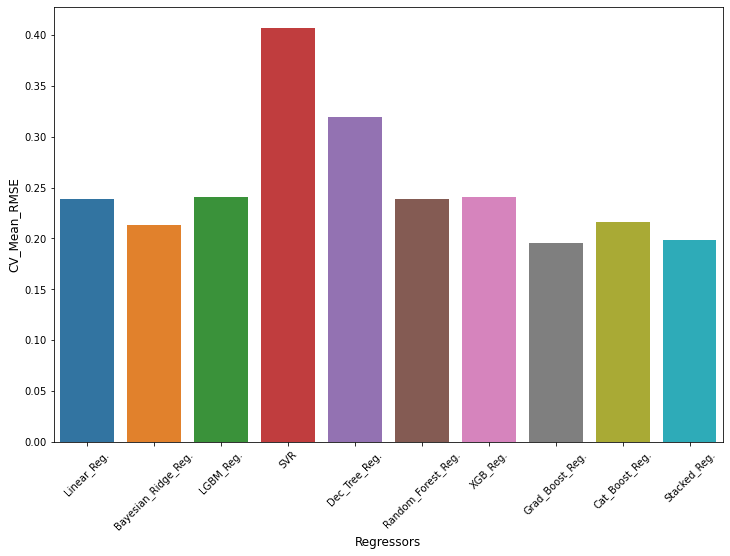

In [69]:
plt.figure(figsize = (12,8))
sns.barplot(final_cv_score['Regressors'],final_cv_score['RMSE_mean'])
plt.xlabel('Regressors', fontsize = 12)
plt.ylabel('CV_Mean_RMSE', fontsize = 12)
plt.xticks(rotation=45)
plt.show()

In [70]:
cat = CatBoostRegressor()
cat_model = cat.fit(X_train,y_train,
                     eval_set = (X_test,y_test),
                     plot=True,
                     verbose = 0)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [71]:
cat_pred = cat_model.predict(X_test)
cat_score = rmse(y_test, cat_pred)
cat_score

0.14262307238173078

In [72]:
feat_imp = cat_model.get_feature_importance(prettified=True)
feat_imp

,Feature Id,Importances
0,assaultPerPop,52.777281
1,robbbPerPop,13.339861
2,assaults,4.940963
3,PctKids2Par,4.400903
4,burglPerPop,1.645824
5,murdPerPop,1.550124
6,PctKidsBornNeverMar,1.510856
7,TotalPctDiv,1.179296
8,rapesPerPop,1.055264
9,racepctblack,1.033162


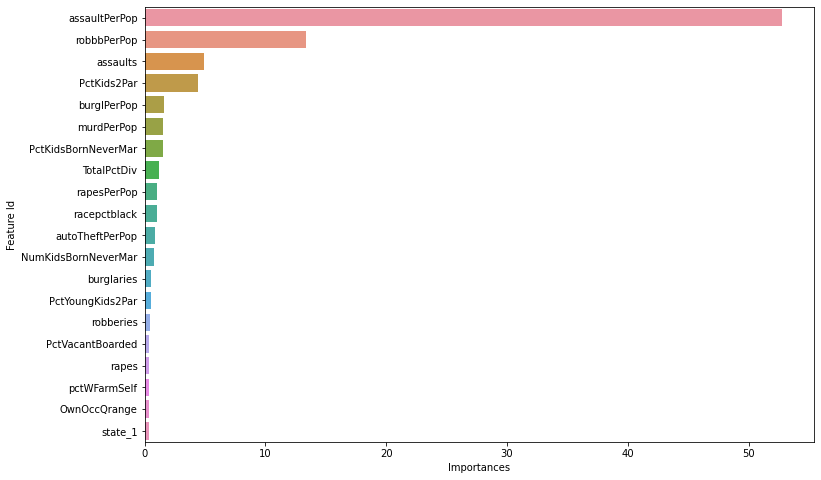

In [73]:
plt.figure(figsize = (12,8))
sns.barplot(feat_imp['Importances'][:20],feat_imp['Feature Id'][:20], orient = 'h')
plt.show()

In [74]:

train_pool = Pool(X_train)
val_pool = Pool(X_test)

explainer = shap.TreeExplainer(cat_model) # insert your model
shap_values = explainer.shap_values(train_pool) # insert your train Pool object

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:200,:], X_train.iloc[:200,:])


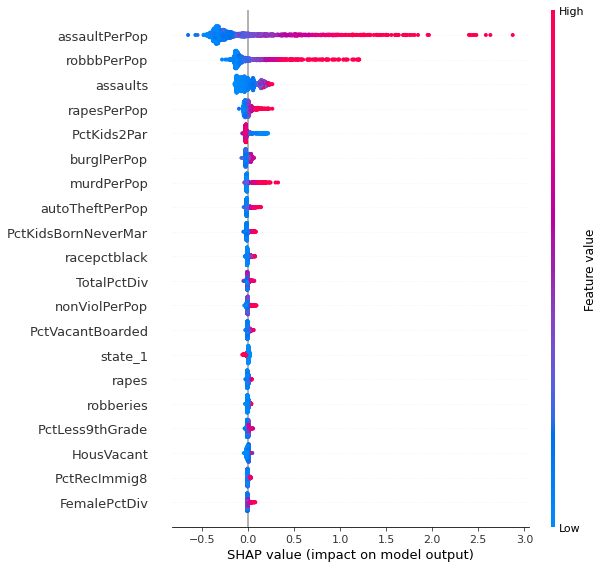

In [75]:
shap.summary_plot(shap_values, X_train)

### Gradient Boost Regressor

In [79]:
gbr = GradientBoostingRegressor()
gbr_model = gbr.fit(X_train,y_train)

In [80]:
gbr_pred = gbr_model.predict(X_test)
gbr_score = rmse(y_test, gbr_pred)
gbr_score

0.1350511589693727

In [82]:
gbr_model.score(X_test, y_test)

0.9801930295297625

In [83]:
gbr_model.score(X_train, y_train)

0.9959064281538407

In [94]:
expected_y  = y_test
predicted_y = gbr_model.predict(X_test)

0.9801930295297625


<AxesSubplot:xlabel='ViolentCrimesPerPop'>

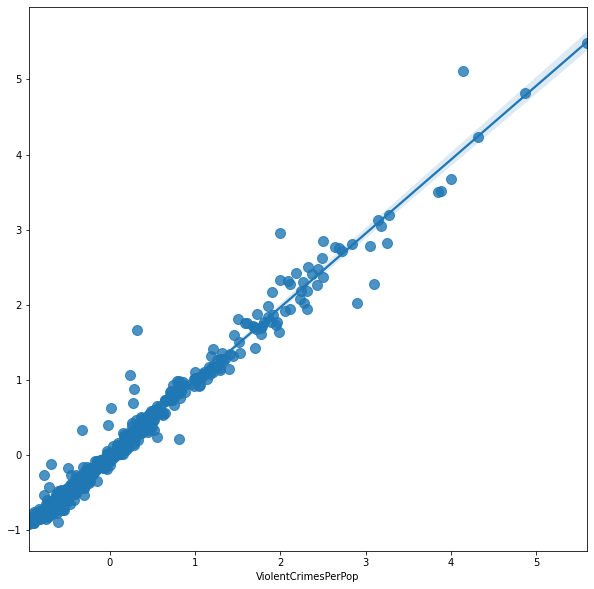

In [97]:
from sklearn import metrics
print(metrics.r2_score(expected_y, predicted_y))

plt.figure(figsize=(10,10))
sns.regplot(expected_y, predicted_y, fit_reg=True, scatter_kws={"s": 100})

### Model Performance after Feature Selection

In [165]:
df_feat_cleaned = df_cleaned[['state_0','state_1','state_2','state_3','state_4','state_5',
                     'racepctblack', 'racePctWhite', 'pctWInvInc', 'pctWPubAsst',
                    'PctPopUnderPov', 'PctUnemployed', 'MalePctDivorce', 'FemalePctDiv',
                    'TotalPctDiv', 'PctFam2Par', 'PctKids2Par', 'PctYoungKids2Par',
                    'PctTeen2Par', 'NumKidsBornNeverMar', 'PctKidsBornNeverMar',
                    'PctPersOwnOccup', 'PctVacantBoarded', 'PctHousNoPhone', 'murdPerPop',
                    'rapes', 'rapesPerPop', 'robbbPerPop', 'assaults', 'assaultPerPop',
                    'burglaries', 'burglPerPop', 'larcPerPop', 'autoTheftPerPop',
                    'ViolentCrimesPerPop', 'nonViolPerPop']]

In [166]:
y = df_feat_cleaned['ViolentCrimesPerPop']
X = df_feat_cleaned.drop(columns = 'ViolentCrimesPerPop')

In [167]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [168]:
cat = CatBoostRegressor()
cat_model = cat.fit(X_train,y_train,
                     eval_set = (X_test,y_test),
                     plot=True,
                     verbose = 0)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [169]:
feat_imp = cat_model.get_feature_importance(prettified=True)
feat_imp

,Feature Id,Importances
0,assaultPerPop,55.576632
1,robbbPerPop,14.651845
2,assaults,3.701056
3,autoTheftPerPop,2.119479
4,nonViolPerPop,2.007465
5,PctKidsBornNeverMar,1.869227
6,racepctblack,1.832071
7,pctWInvInc,1.538901
8,burglaries,1.416044
9,rapes,1.350195


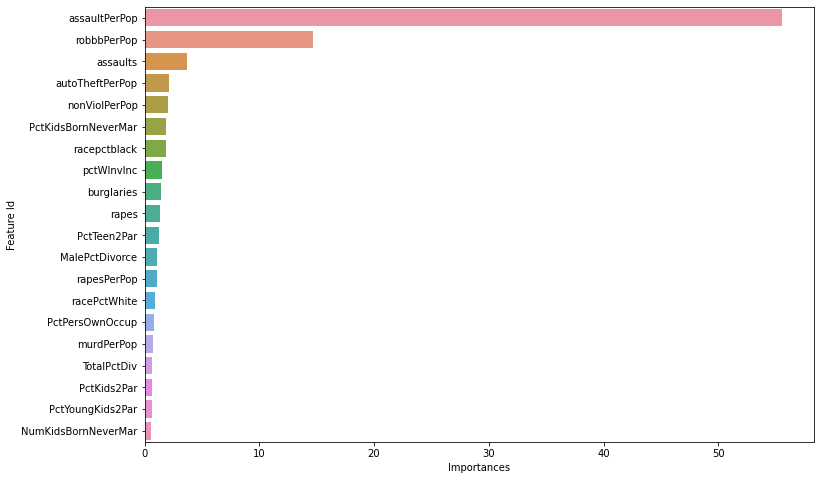

In [170]:
plt.figure(figsize = (12,8))
sns.barplot(feat_imp['Importances'][:20],feat_imp['Feature Id'][:20], orient = 'h')
plt.show()

In [171]:

train_pool = Pool(X_train)
val_pool = Pool(X_test)

explainer = shap.TreeExplainer(cat_model) # insert your model
shap_values = explainer.shap_values(train_pool) # insert your train Pool object

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:200,:], X_train.iloc[:200,:])

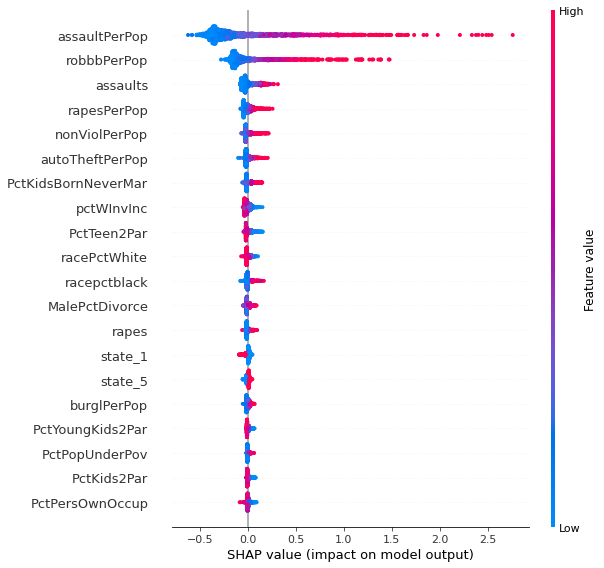

In [172]:
shap.summary_plot(shap_values, X_train)

In [154]:
gbr = GradientBoostingRegressor()
gbr_model = gbr.fit(X_train,y_train)

In [155]:
gbr_pred = gbr_model.predict(X_test)
gbr_score = rmse(y_test, gbr_pred)
gbr_score

0.13236039968783445

In [156]:
gbr_model.score(X_test, y_test)

0.9809744349968497

In [157]:
gbr_model.score(X_train, y_train)

0.9947211026615003

In [158]:
expected_y  = y_test
predicted_y = gbr_model.predict(X_test)

0.9809744349968497


<AxesSubplot:xlabel='ViolentCrimesPerPop'>

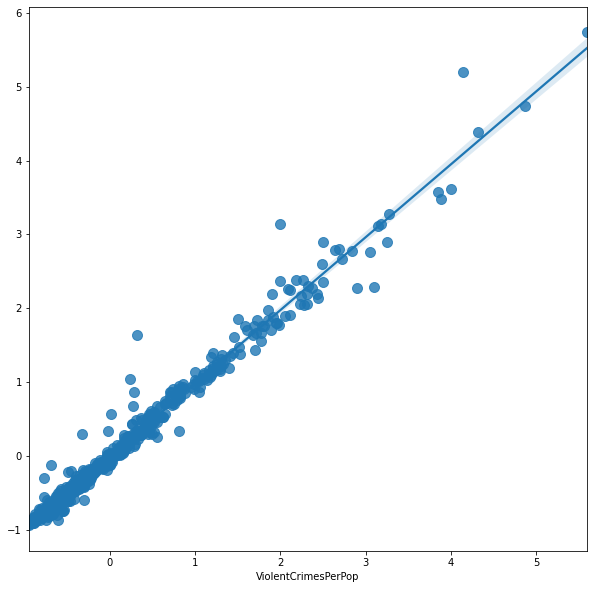

In [159]:
from sklearn import metrics
print(metrics.r2_score(expected_y, predicted_y))

plt.figure(figsize=(10,10))
sns.regplot(expected_y, predicted_y, fit_reg=True, scatter_kws={"s": 100})

### Hyperparameter Tuning

In [137]:
parameters = {
    "n_estimators":[5,50,250,500],
    "max_depth":[1,3,5,7,9],
    "learning_rate":[0.01,0.1,1,10,100]
}

In [142]:
from sklearn.model_selection import GridSearchCV
cv = GridSearchCV(gbr,parameters,cv=2)
cv.fit(X_train,y_train.values.ravel())

GridSearchCV(cv=2, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.01, 0.1, 1, 10, 100],
                         'max_depth': [1, 3, 5, 7, 9],
                         'n_estimators': [5, 50, 250, 500]})

In [143]:
def display(results):
    print(f'Best parameters are: {results.best_params_}')
    print("\n")
    mean_score = results.cv_results_['mean_test_score']
    std_score = results.cv_results_['std_test_score']
    params = results.cv_results_['params']
    for mean,std,params in zip(mean_score,std_score,params):
        print(f'{round(mean,3)} + or -{round(std,3)} for the {params}')

In [144]:
display(cv)

Best parameters are: {'learning_rate': 0.1, 'max_depth': 1, 'n_estimators': 500}


0.06 + or -0.003 for the {'learning_rate': 0.01, 'max_depth': 1, 'n_estimators': 5}
0.409 + or -0.012 for the {'learning_rate': 0.01, 'max_depth': 1, 'n_estimators': 50}
0.851 + or -0.005 for the {'learning_rate': 0.01, 'max_depth': 1, 'n_estimators': 250}
0.937 + or -0.004 for the {'learning_rate': 0.01, 'max_depth': 1, 'n_estimators': 500}
0.082 + or -0.005 for the {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 5}
0.565 + or -0.011 for the {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50}
0.938 + or -0.001 for the {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 250}
0.955 + or -0.005 for the {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}
0.087 + or -0.004 for the {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 5}
0.586 + or -0.019 for the {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50}
0.941 + or -0.0 for the {'learning_rate': 0.01, 'max_dept

### Root Cause Analysis

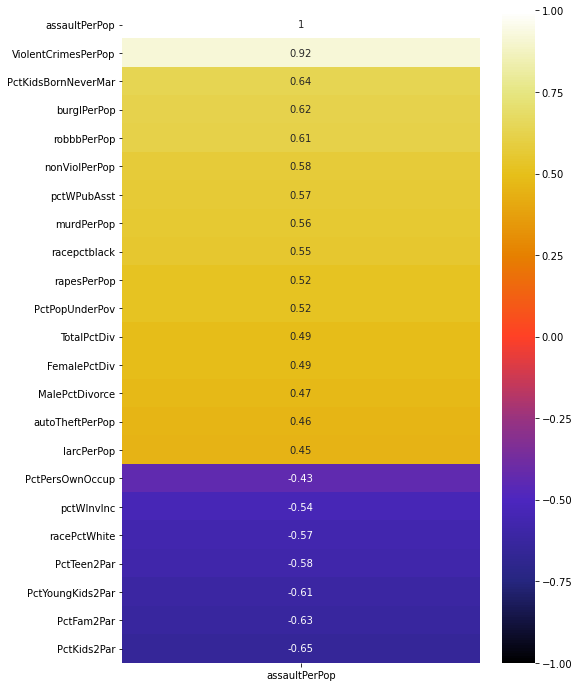

In [194]:
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(corr_graph.corr()[['assaultPerPop']].sort_values(by='assaultPerPop', ascending=False), vmin=-1, vmax=1, annot=True, cmap='CMRmap')

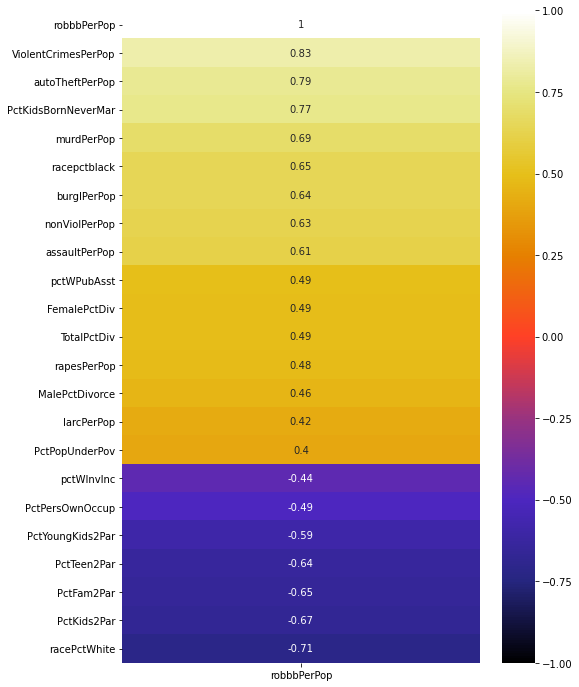

In [195]:
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(corr_graph.corr()[['robbbPerPop']].sort_values(by='robbbPerPop', ascending=False), vmin=-1, vmax=1, annot=True, cmap='CMRmap')